# **MelanoAI: Intelligent Skin Cancer Screening**

####**Objective**: Develop an AI model to classify skin lesions as benign or malignant accurately and create a user-friendly interface for interaction.

####**Dataset**: Includes images of skin lesions labeled as benign or malignant.


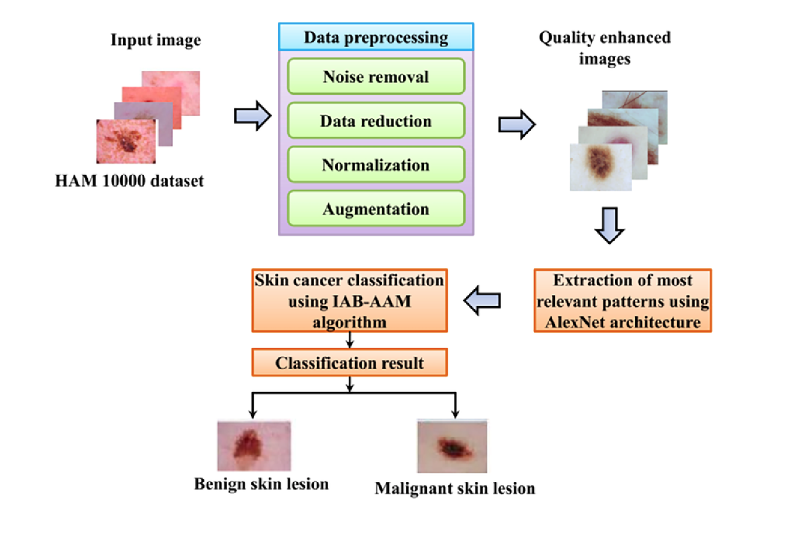

# Importing Necessary Libraries

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from collections import defaultdict
import cv2
import imgaug.augmenters as iaa
import imgaug.augmenters as iaa
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix

# Loading The Datasets

In [ ]:
# Paths to the dataset
train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/train'
test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/test'

# Subdirectories
categories = ['benign', 'malignant']


image_paths = {
    'train': {
        'benign': [os.path.join(train_dir, 'benign', f) for f in os.listdir(os.path.join(train_dir, 'benign'))],
        'malignant': [os.path.join(train_dir, 'malignant', f) for f in os.listdir(os.path.join(train_dir, 'malignant'))]
    },
    'test': {
        'benign': [os.path.join(test_dir, 'benign', f) for f in os.listdir(os.path.join(test_dir, 'benign'))],
        'malignant': [os.path.join(test_dir, 'malignant', f) for f in os.listdir(os.path.join(test_dir, 'malignant'))]
    }
}

train_image_paths = {
    'benign': [os.path.join(train_dir, 'benign', f) for f in os.listdir(os.path.join(train_dir, 'benign'))],
    'malignant': [os.path.join(train_dir, 'malignant', f) for f in os.listdir(os.path.join(train_dir, 'malignant'))]
}

test_image_paths = {
    'benign': [os.path.join(test_dir, 'benign', f) for f in os.listdir(os.path.join(test_dir, 'benign'))],
    'malignant': [os.path.join(test_dir, 'malignant', f) for f in os.listdir(os.path.join(test_dir, 'malignant'))]

}

train_path = '/content/drive/MyDrive/melanoma_cancer_dataset/train'
test_path = '/content/drive/MyDrive/melanoma_cancer_dataset/test'

# Checking If The Dataset Has Been Loaded

Train Data Samples


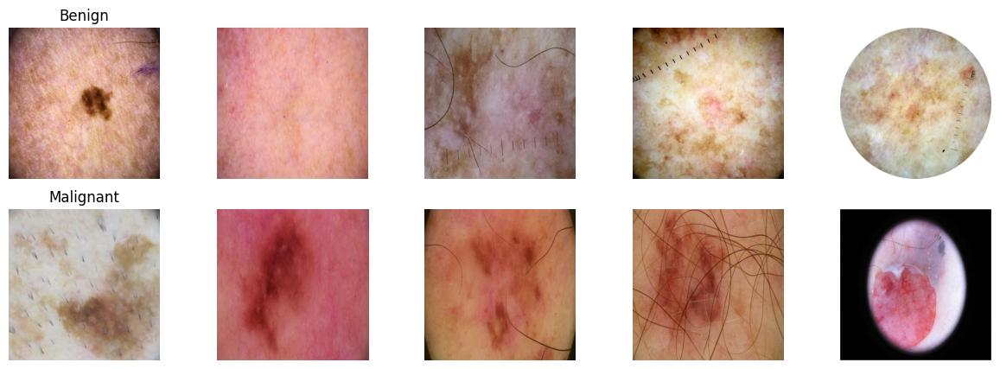

Test Data Samples


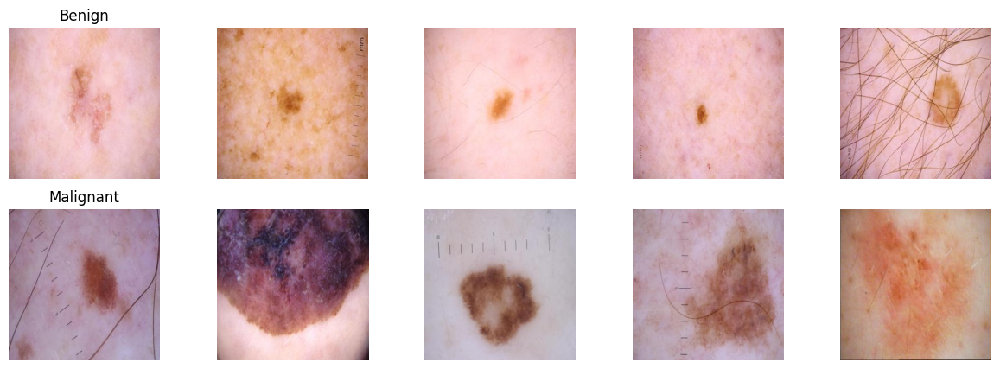

In [ ]:
# Function to display sample images from each category
def display_samples(dir_path, categories, num_samples=5):
    fig, axes = plt.subplots(len(categories), num_samples, figsize=(15, 5))

    for i, category in enumerate(categories):
        category_path = os.path.join(dir_path, category)
        files = os.listdir(category_path)[:num_samples]

        for j, file in enumerate(files):
            img_path = os.path.join(category_path, file)
            img = Image.open(img_path)
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(category.capitalize())

    plt.show()

# Display samples from training data
print("Train Data Samples")
display_samples(train_dir, categories)

# Display samples from testing data
print("Test Data Samples")
display_samples(test_dir, categories)


The Dataset Has Been Loaded

## Counting Number Of Images In The Dataset

In [ ]:
# Function to count images in a directory
def count_images(dir_path, categories):
    total_images = 0
    count_dict = {}

    for category in categories:
        category_path = os.path.join(dir_path, category)
        num_images = len(os.listdir(category_path))
        count_dict[category] = num_images
        total_images += num_images

    return count_dict, total_images


# Count images in train and test directories
train_counts, train_total = count_images(train_dir, categories)
test_counts, test_total = count_images(test_dir, categories)

# Display the counts
print(f"Train Data: {train_counts}, Total: {train_total}")
print(f"Test Data: {test_counts}, Total: {test_total}")


Train Data: {'benign': 5000, 'malignant': 4605}, Total: 9605
Test Data: {'benign': 500, 'malignant': 500}, Total: 1000


Thus The Train Data Has 9605 Images and Test Data Contains 1000 Images

**Total 10,605 Images**



## Now Let's Look The Number Of Images Available In Each Class in Both Train Data And Test Data

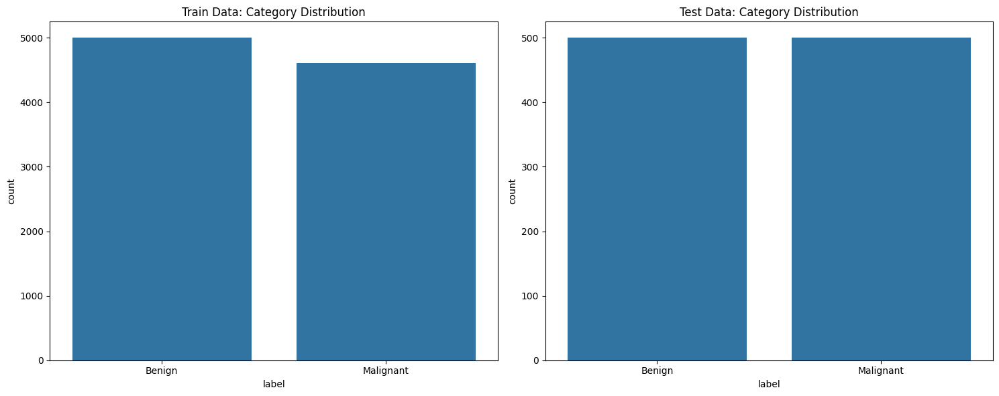

In [ ]:
def get_image_paths_and_labels(dir_path, categories):
    image_paths = []
    labels = []

    for category in categories:
        category_path = os.path.join(dir_path, category)
        files = os.listdir(category_path)

        for file in files:
            img_path = os.path.join(category_path, file)
            image_paths.append(img_path)
            labels.append(category.capitalize())  # Capitalize for better readability

    return image_paths, labels

# Get image paths and labels for train and test datasets
train_image_paths, train_labels = get_image_paths_and_labels(train_dir, categories)
test_image_paths, test_labels = get_image_paths_and_labels(test_dir, categories)

# Create DataFrame for easier visualization
train_df = pd.DataFrame({'image_path': train_image_paths, 'label': train_labels})
test_df = pd.DataFrame({'image_path': test_image_paths, 'label': test_labels})

# Plot distribution of categories side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
sns.countplot(x='label', data=train_df, ax=axes[0])
axes[0].set_title('Train Data: Category Distribution')
sns.countplot(x='label', data=test_df, ax=axes[1])
axes[1].set_title('Test Data: Category Distribution')
plt.tight_layout()
plt.show()


#**Overall Image Distribution**

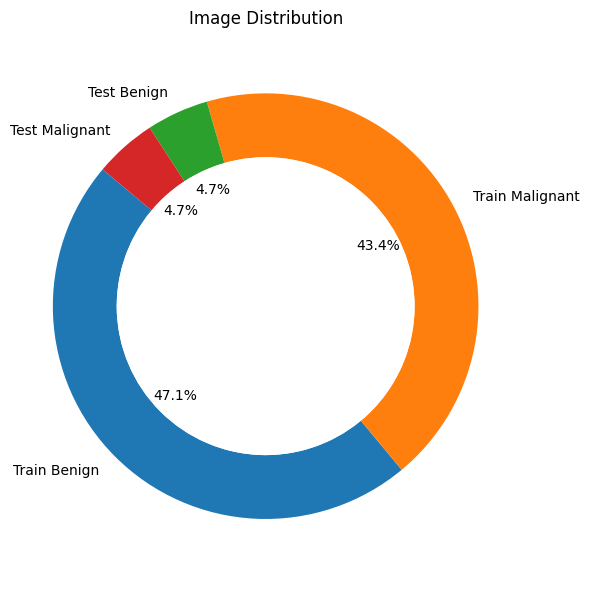

In [ ]:
labels = ['Train Benign', 'Train Malignant', 'Test Benign', 'Test Malignant']
sizes = [5000, 4605, 500, 500]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

fig, ax = plt.subplots(figsize=(6, 6))

# Create a donut chart
wedges, texts, autotexts = ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=colors, wedgeprops=dict(width=0.3))

# Add a center circle to create the donut shape
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig.gca().add_artist(centre_circle)

ax.axis('equal')  # Equal aspect ratio ensures the pie chart is circular.
ax.set_title('Image Distribution')
plt.tight_layout()
plt.show()


*The* Train Data Is Slightly **Imbalanced**


The Test Data Is **Balanced**

##Image Dimensions

In [ ]:
# Function to check if all images have the same dimensions
def check_image_dimensions(dir_path, categories):
    dimensions_set = set()

    for category in categories:
        category_path = os.path.join(dir_path, category)
        files = os.listdir(category_path)

        for file in files:
            img_path = os.path.join(category_path, file)
            with Image.open(img_path) as img:
                dimensions_set.add(img.size)

    return dimensions_set

# Check dimensions for train data
train_dimensions_set = check_image_dimensions(train_dir, categories)
print(f"Unique dimensions in training data: {train_dimensions_set}")

# Check dimensions for test data
test_dimensions_set = check_image_dimensions(test_dir, categories)
print(f"Unique dimensions in testing data: {test_dimensions_set}")

# Check if all images have the same dimensions
all_train_same = len(train_dimensions_set) == 1
all_test_same = len(test_dimensions_set) == 1

if all_train_same:
    print("All train images have the same dimensions.")
else:
    print(f"Train images have varying dimensions: {train_dimensions_set}")

if all_test_same:
    print("All test images have the same dimensions.")
else:
    print(f"Test images have varying dimensions: {test_dimensions_set}")


Unique dimensions in training data: {(300, 300)}
Unique dimensions in testing data: {(300, 300)}
All train images have the same dimensions.
All test images have the same dimensions.


All Images Have The Dimensions (300x300)

#Visualizing the pixel value distributions for both train and test datasets.
###It's a great way to understand the overall brightness and contrast of the images

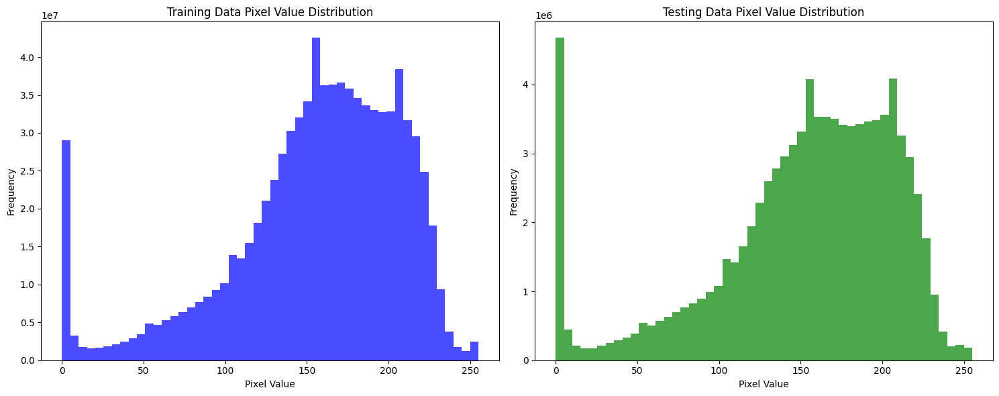

In [ ]:
# Function to gather pixel values
def gather_pixel_values(dir_path, categories):
    pixel_values = []

    for category in categories:
        category_path = os.path.join(dir_path, category)
        files = os.listdir(category_path)

        for file in files:
            img_path = os.path.join(category_path, file)
            with Image.open(img_path) as img:
                img = img.convert('L')  # Convert to grayscale
                pixel_values.append(np.array(img).flatten())

    return pixel_values

# Gather pixel values for training data
train_pixel_values = gather_pixel_values(train_dir, categories)
test_pixel_values = gather_pixel_values(test_dir, categories)

# Function to plot pixel value distribution
def plot_pixel_distribution_side_by_side(train_values, test_values):
    train_values = np.concatenate(train_values)
    test_values = np.concatenate(test_values)

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    axes[0].hist(train_values, bins=50, color='b', alpha=0.7)
    axes[0].set_title('Training Data Pixel Value Distribution')
    axes[0].set_xlabel('Pixel Value')
    axes[0].set_ylabel('Frequency')

    axes[1].hist(test_values, bins=50, color='g', alpha=0.7)
    axes[1].set_title('Testing Data Pixel Value Distribution')
    axes[1].set_xlabel('Pixel Value')
    axes[1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Plot pixel value distributions side by side
plot_pixel_distribution_side_by_side(train_pixel_values, test_pixel_values)


Both datasets seem to be well-aligned in terms of pixel intensity distribution, ensuring the model trained on this data will likely perform consistently when evaluated.

##Analysing Color Histograms

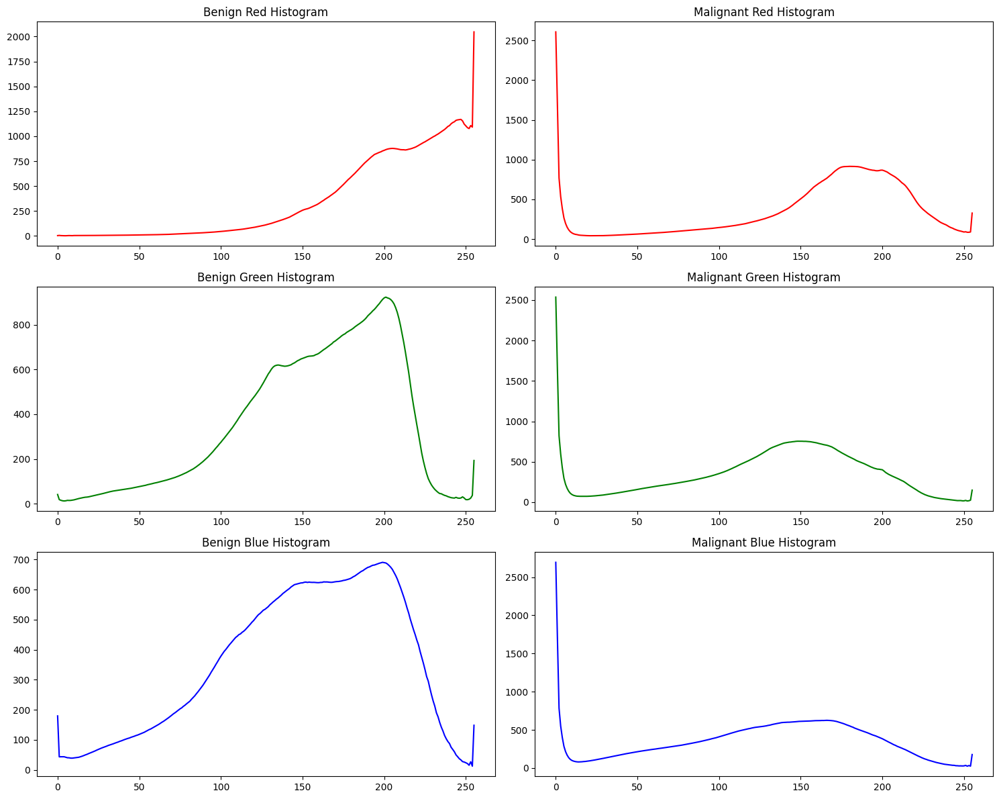

In [ ]:
# Function to calculate color histograms
def calculate_color_histograms(image_paths, categories):
    histograms = defaultdict(list)

    for category in categories:
        for img_path in image_paths[category]:
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            for channel, color in enumerate(['r', 'g', 'b']):
                hist = cv2.calcHist([img], [channel], None, [256], [0, 256])
                histograms[f"{category}_{color}"].append(hist.flatten())

    return histograms

# Prepare image paths for easy processing
image_paths = {
    'benign': [os.path.join(train_dir, 'benign', f) for f in os.listdir(os.path.join(train_dir, 'benign'))],
    'malignant': [os.path.join(train_dir, 'malignant', f) for f in os.listdir(os.path.join(train_dir, 'malignant'))]
}

# Calculate color histograms
color_histograms = calculate_color_histograms(image_paths, categories)

# Plot color histograms side by side
fig, axes = plt.subplots(3, 2, figsize=(15, 12))
colors = ['Red', 'Green', 'Blue']

for i, color in enumerate(colors):
    benign_hist = np.mean(color_histograms[f'benign_{color[0].lower()}'], axis=0)
    malignant_hist = np.mean(color_histograms[f'malignant_{color[0].lower()}'], axis=0)

    axes[i, 0].plot(benign_hist, color=color.lower())
    axes[i, 0].set_title(f'Benign {color} Histogram')

    axes[i, 1].plot(malignant_hist, color=color.lower())
    axes[i, 1].set_title(f'Malignant {color} Histogram')

plt.tight_layout()
plt.show()


Benign images seem to be lighter and have a broader range of colors, whereas malignant images are darker with more concentrated lower intensity values

###Image Brightness Analysis


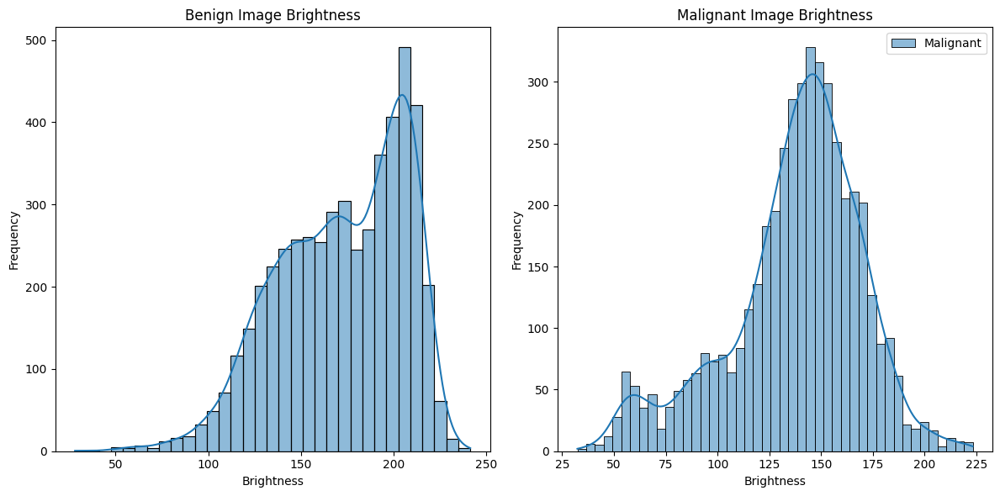

In [ ]:
# Function to calculate image brightness
def calculate_brightness(image_paths, categories):
    brightness = defaultdict(list)

    for category in categories:
        for img_path in image_paths[category]:
            img = Image.open(img_path).convert('L')  # Convert to grayscale
            img_array = np.array(img)
            brightness[category].append(np.mean(img_array))

    return brightness

# Prepare image paths for easy processing
image_paths = {
    'benign': [os.path.join(train_dir, 'benign', f) for f in os.listdir(os.path.join(train_dir, 'benign'))],
    'malignant': [os.path.join(train_dir, 'malignant', f) for f in os.listdir(os.path.join(train_dir, 'malignant'))]
}

# Calculate brightness for training data
brightness_train = calculate_brightness(image_paths, categories)

# Plot brightness distributions side by side
plt.figure(figsize=(12, 6))
for i, category in enumerate(categories):
    sns.histplot(brightness_train[category], kde=True, label=category.capitalize(), ax=plt.subplot(1, 2, i+1))
    plt.title(f'{category.capitalize()} Image Brightness')
    plt.xlabel('Brightness')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.legend()
plt.show()


Benign images tend to be brighter on average, while malignant images exhibit a more balanced brightness distribution

##Image Contrast Analysis

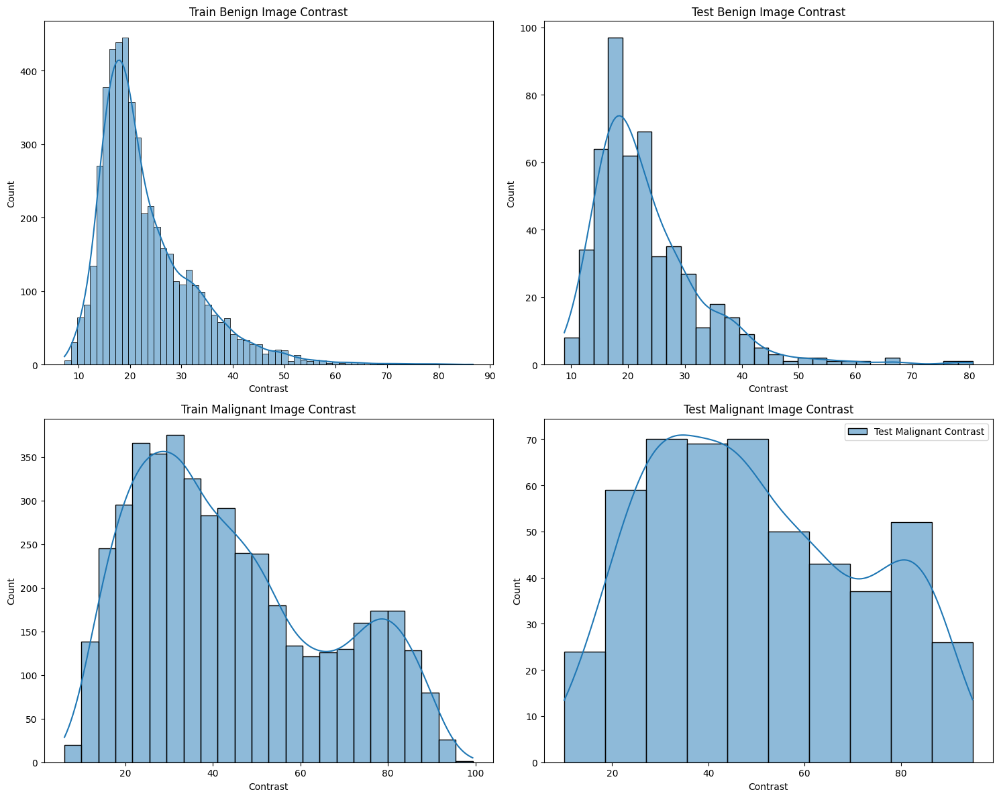

In [ ]:
# Function to calculate image contrast
def calculate_contrast(image_paths, categories):
    contrast = defaultdict(list)

    for phase in ['train', 'test']:
        for category in categories:
            for img_path in image_paths[phase][category]:
                img = Image.open(img_path).convert('L')  # Convert to grayscale
                img_array = np.array(img)
                contrast[f"{phase}_{category}"].append(np.std(img_array))

    return contrast

# Calculate contrast
contrast = calculate_contrast(image_paths, categories)

# Plot contrast distributions side by side
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

for i, category in enumerate(categories):
    for j, phase in enumerate(['train', 'test']):
        sns.histplot(contrast[f"{phase}_{category}"], kde=True, label=f'{phase.capitalize()} {category.capitalize()} Contrast', ax=axes[i, j])
        axes[i, j].set_title(f'{phase.capitalize()} {category.capitalize()} Image Contrast')
        axes[i, j].set_xlabel('Contrast')

plt.tight_layout()
plt.legend()
plt.show()


### Heatmap To Visualise Pixel Concentration Across the images

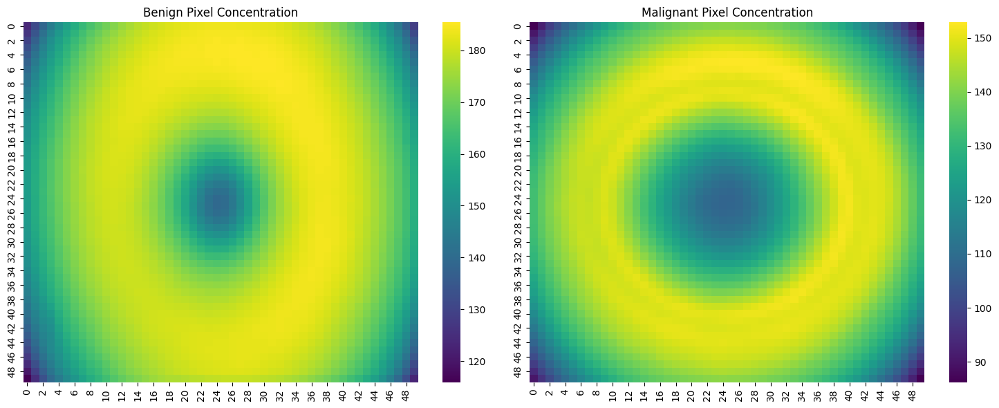

In [ ]:
# Function to calculate pixel value concentrations
def calculate_pixel_concentration(image_paths, categories, size=(50, 50)):
    concentration = defaultdict(list)

    for category in categories:
        for img_path in image_paths[category]:
            img = Image.open(img_path).convert('L')
            img = img.resize(size)
            img_array = np.array(img)
            concentration[category].append(img_array.flatten())

    return concentration

# Calculate pixel concentration
pixel_concentration_train = calculate_pixel_concentration(image_paths, categories)

# Plot heatmaps
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

sns.heatmap(np.mean(pixel_concentration_train['benign'], axis=0).reshape(50, 50), ax=axes[0], cmap='viridis')
axes[0].set_title('Benign Pixel Concentration')

sns.heatmap(np.mean(pixel_concentration_train['malignant'], axis=0).reshape(50, 50), ax=axes[1], cmap='viridis')
axes[1].set_title('Malignant Pixel Concentration')

plt.tight_layout()
plt.show()


Benign Images: Show a more even distribution of pixel intensities across the image.

Malignant Images: Tend to have higher concentrations of specific pixel intensities, which could be indicative of certain textures or patterns within these images.

###Visualizing Image Sizes of All Images

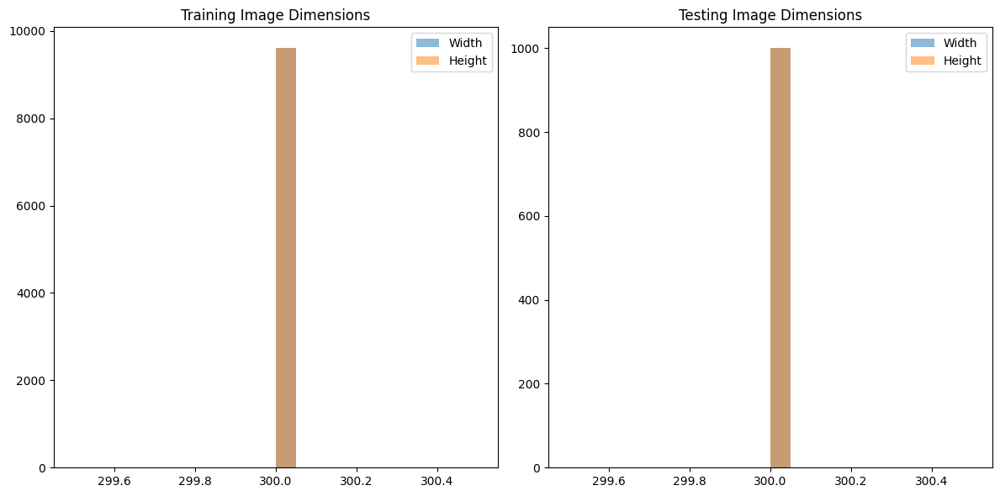

In [ ]:
# Function to gather image sizes
def gather_image_sizes(dir_path, categories):
    sizes = []

    for category in categories:
        category_path = os.path.join(dir_path, category)
        files = os.listdir(category_path)

        for file in files:
            img_path = os.path.join(category_path, file)
            with Image.open(img_path) as img:
                sizes.append(img.size)

    return sizes

# Gather image sizes for training data
train_sizes = gather_image_sizes(train_dir, categories)
test_sizes = gather_image_sizes(test_dir, categories)

# Plot image size distribution
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist([s[0] for s in train_sizes], bins=20, alpha=0.5, label='Width')
plt.hist([s[1] for s in train_sizes], bins=20, alpha=0.5, label='Height')
plt.title('Training Image Dimensions')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist([s[0] for s in test_sizes], bins=20, alpha=0.5, label='Width')
plt.hist([s[1] for s in test_sizes], bins=20, alpha=0.5, label='Height')
plt.title('Testing Image Dimensions')
plt.legend()

plt.tight_layout()
plt.show()


Both training and testing images show uniform dimensions with a width and height of 300 pixels

###Aspect Ratio of the Images

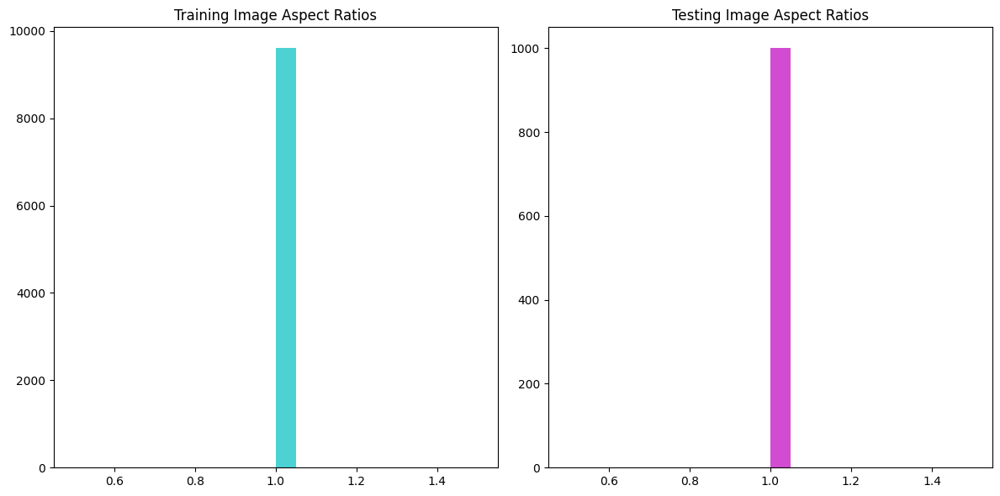

In [ ]:
# Function to calculate aspect ratios
def calculate_aspect_ratios(sizes):
    aspect_ratios = [w/h for w, h in sizes]
    return aspect_ratios

# Calculate aspect ratios
train_aspect_ratios = calculate_aspect_ratios(train_sizes)
test_aspect_ratios = calculate_aspect_ratios(test_sizes)

# Plot aspect ratio distribution
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(train_aspect_ratios, bins=20, color='c', alpha=0.7)
plt.title('Training Image Aspect Ratios')
plt.subplot(1, 2, 2)
plt.hist(test_aspect_ratios, bins=20, color='m', alpha=0.7)
plt.title('Testing Image Aspect Ratios')
plt.tight_layout()
plt.show()


Reveals that both the train and test images in our dataset have an aspect ratio of 1.0. This means all images are perfectly square

#**Preprocessing**

##Normalisation
Scaling the pixel values to the range [0, 1]

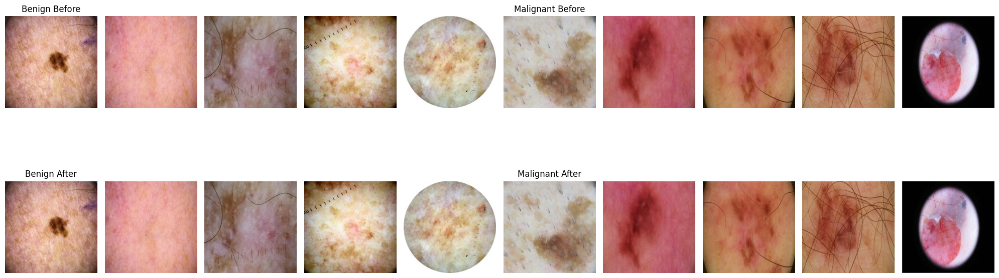

In [ ]:
# Function to normalize image
def normalize_image(image):
    return np.array(image) / 255.0

# Load a few images
def load_images(image_paths, categories, num_images=5):
    images = {category: [] for category in categories}
    for category in categories:
        for img_path in image_paths[category][:num_images]:
            img = Image.open(img_path)
            images[category].append(img)
    return images

# Display before and after normalization
def display(images, categories):
    fig, axes = plt.subplots(2, len(categories) * len(images[categories[0]]), figsize=(20, 8))

    for i, category in enumerate(categories):
        for j, img in enumerate(images[category]):
            axes[0, i * len(images[category]) + j].imshow(img)
            axes[0, i * len(images[category]) + j].axis('off')
            if j == 0:
                axes[0, i * len(images[category]) + j].set_title(f'{category.capitalize()} Before')

            normalized_img = normalize_image(img)
            axes[1, i * len(images[category]) + j].imshow(normalized_img)
            axes[1, i * len(images[category]) + j].axis('off')
            if j == 0:
                axes[1, i * len(images[category]) + j].set_title(f'{category.capitalize()} After')

    plt.tight_layout()
    plt.show()

# Load images
image_paths = {
    'benign': [os.path.join(train_dir, 'benign', f) for f in os.listdir(os.path.join(train_dir, 'benign'))],
    'malignant': [os.path.join(train_dir, 'malignant', f) for f in os.listdir(os.path.join(train_dir, 'malignant'))]
}
categories = ['benign', 'malignant']
images = load_images(image_paths, categories)

# Display images before and after normalization
display(images, categories)



In [ ]:
# Function to calculate statistics
def statistics(images, normalize=False):
    means = []
    stds = []

    for category in categories:
        for img in images[category]:
            img_array = np.array(img).flatten()
            if normalize:
                img_array = img_array / 255.0
            means.append(np.mean(img_array))
            stds.append(np.std(img_array))

    return np.mean(means), np.std(means), np.mean(stds), np.std(stds)

# Calculate statistics before normalization
mean_before, std_mean_before, std_before, std_std_before = statistics(images)

# Calculate statistics after normalization
mean_after, std_mean_after, std_after, std_std_after = statistics(images, normalize=True)

# Print the results
print(f"Before Normalization - Mean: {mean_before:.2f}, Std Dev: {std_before:.2f}")
print(f"After Normalization - Mean: {mean_after:.2f}, Std Dev: {std_after:.2f}")


Before Normalization - Mean: 141.92, Std Dev: 46.21
After Normalization - Mean: 0.56, Std Dev: 0.18


After scaling, pixel values are uniformly distributed within the [0, 1] range. The reduced mean and standard deviation reflect a balanced dataset with consistent brightness levels, facilitating improved model performance.

#**Removing Duplicates**



Number of duplicate images in train benign: 8


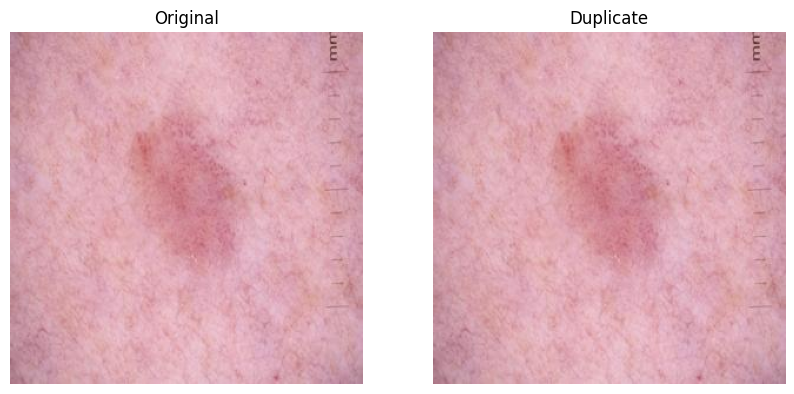

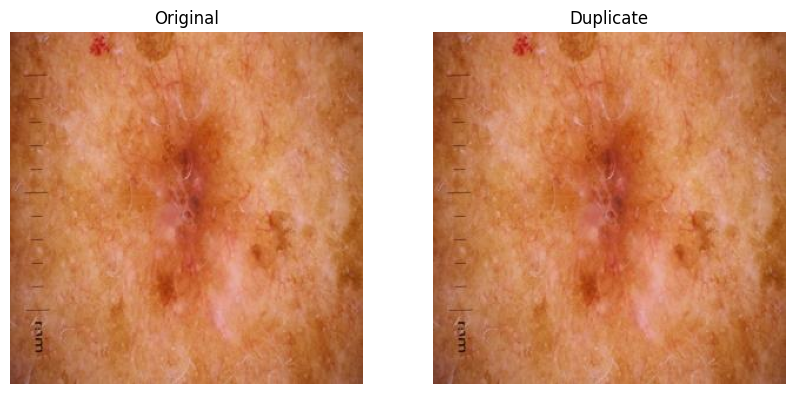

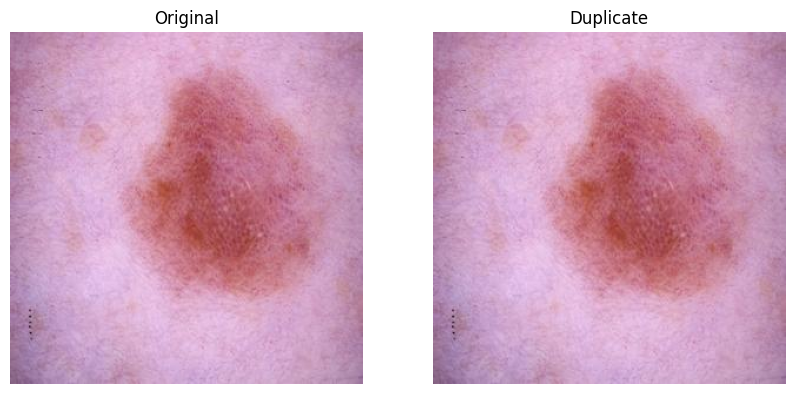

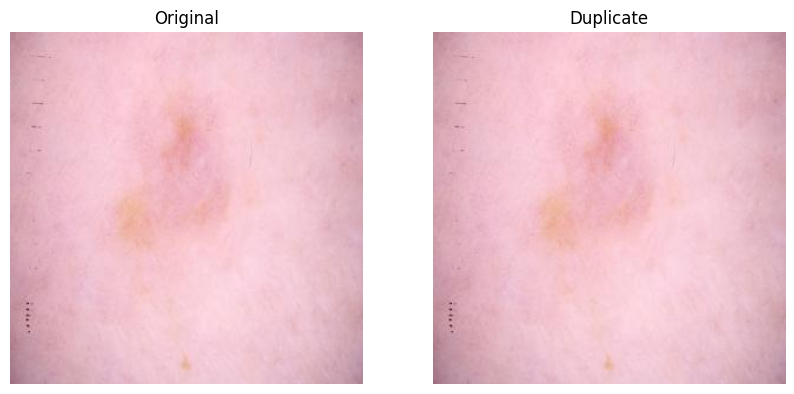

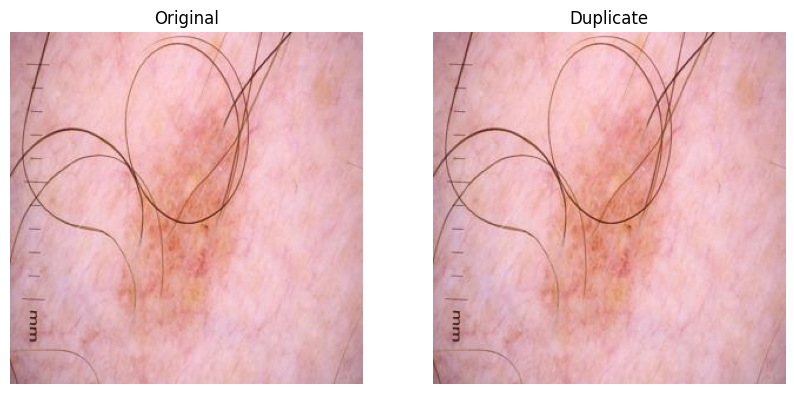

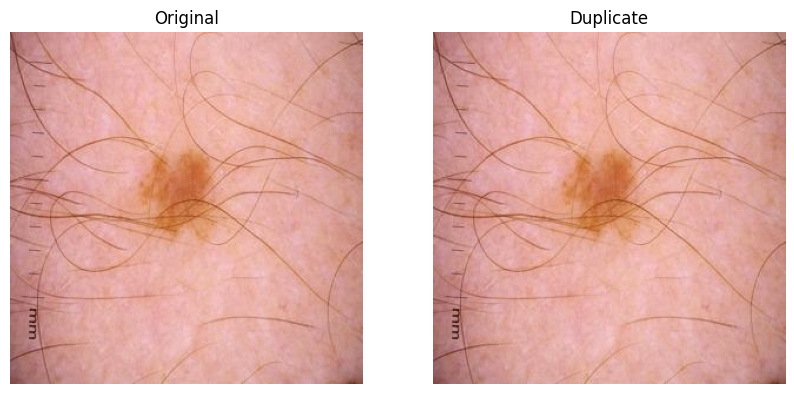

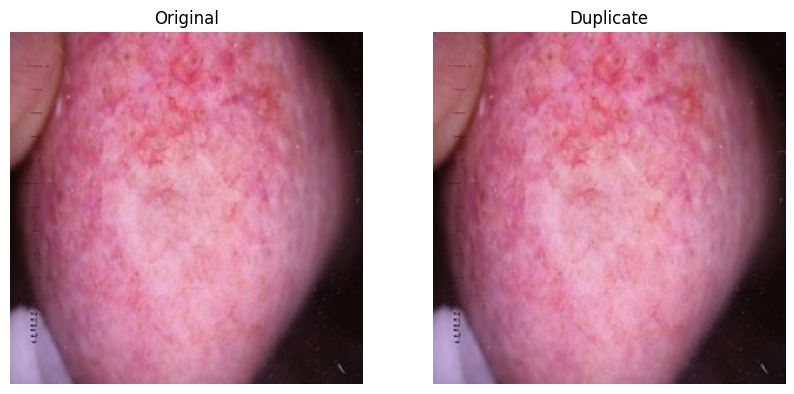

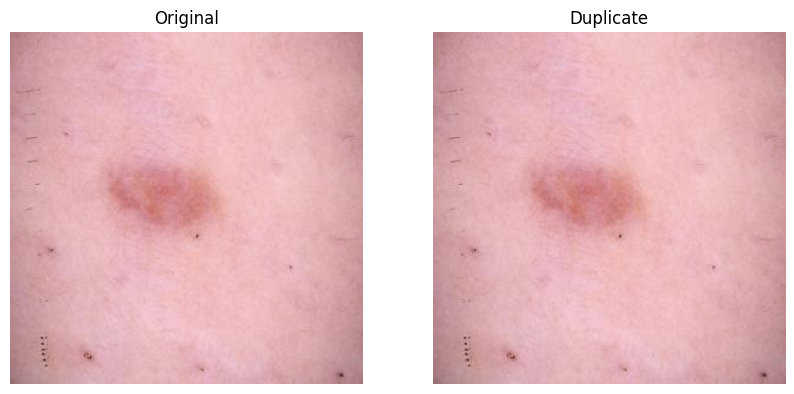

Number of duplicate images in train malignant: 18


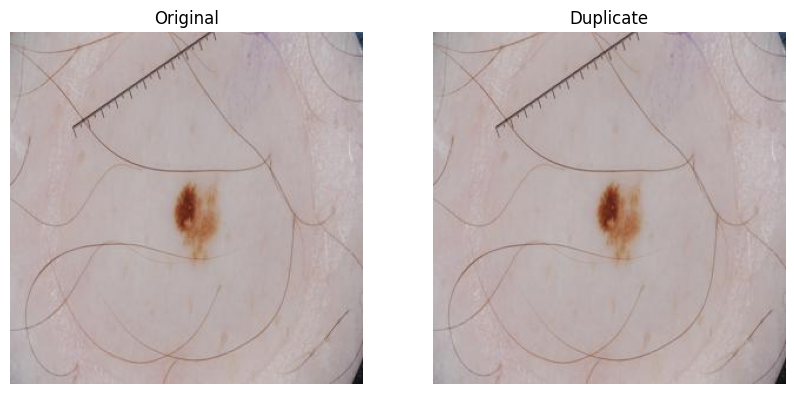

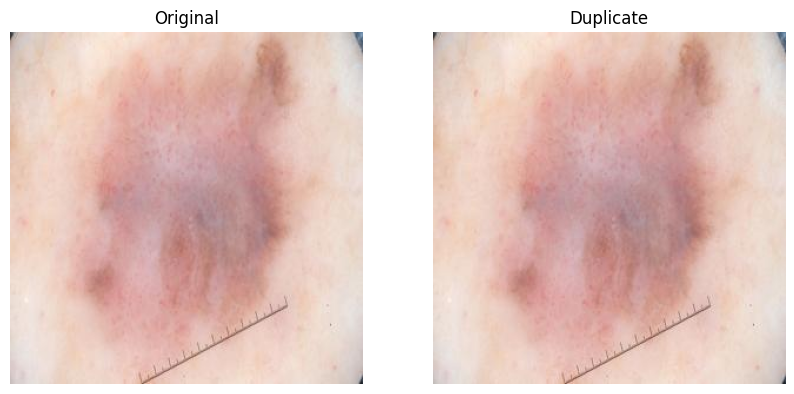

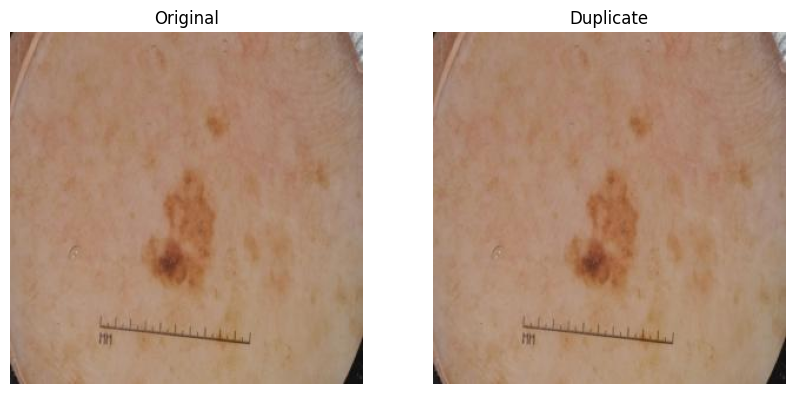

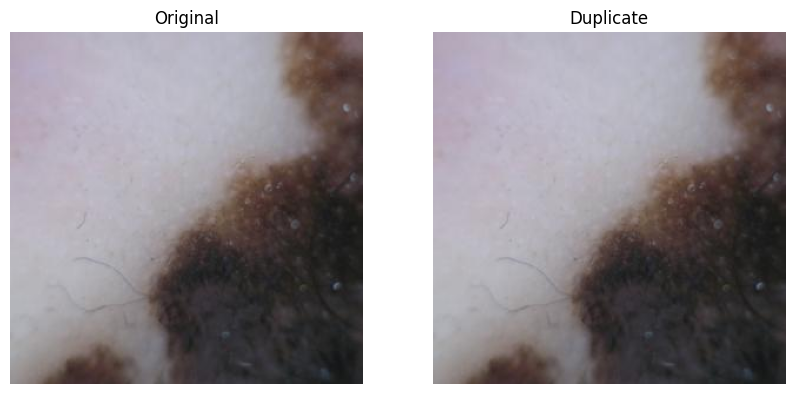

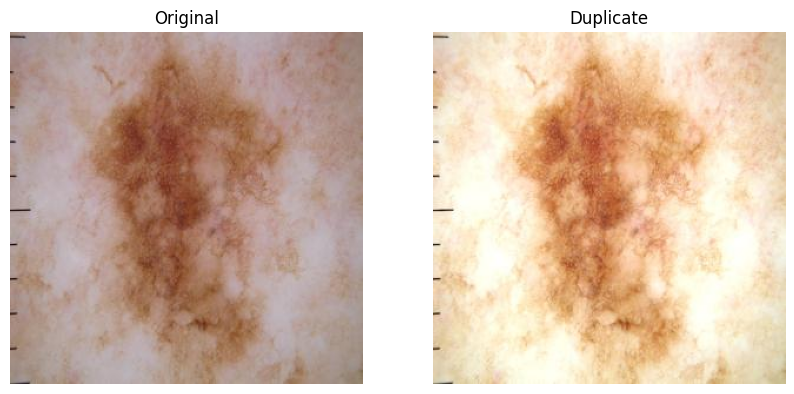

...

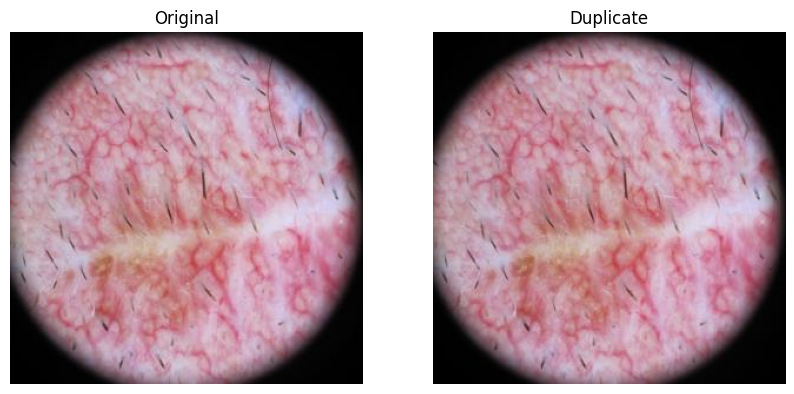

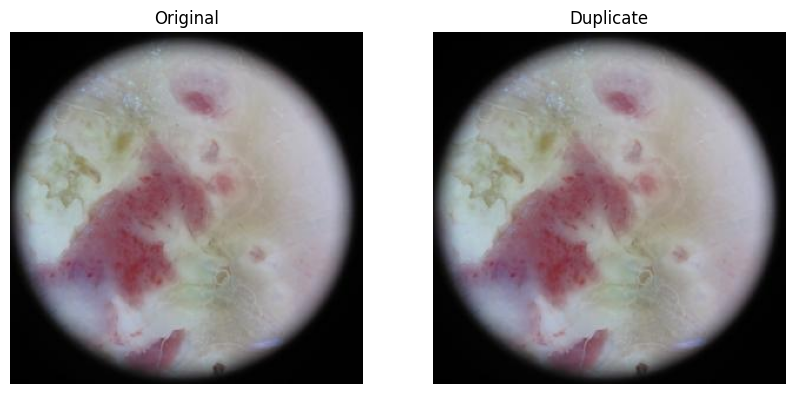

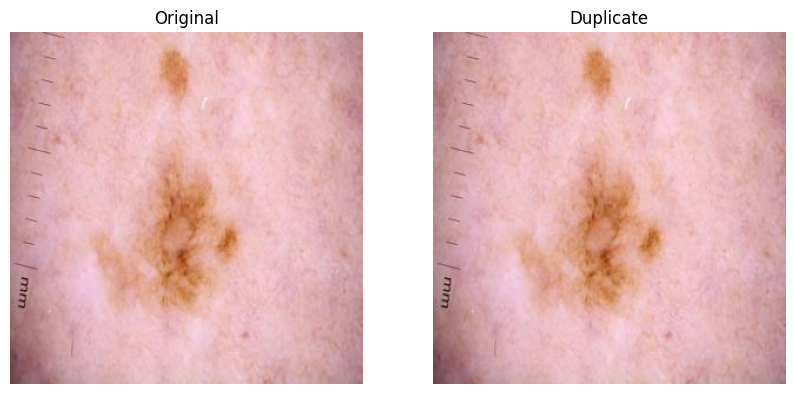

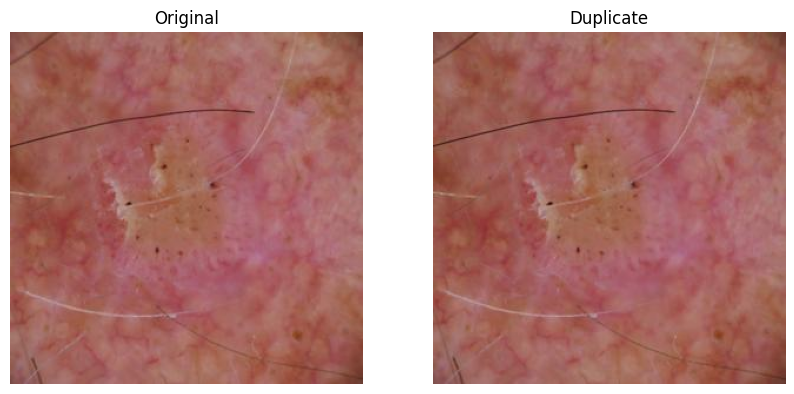

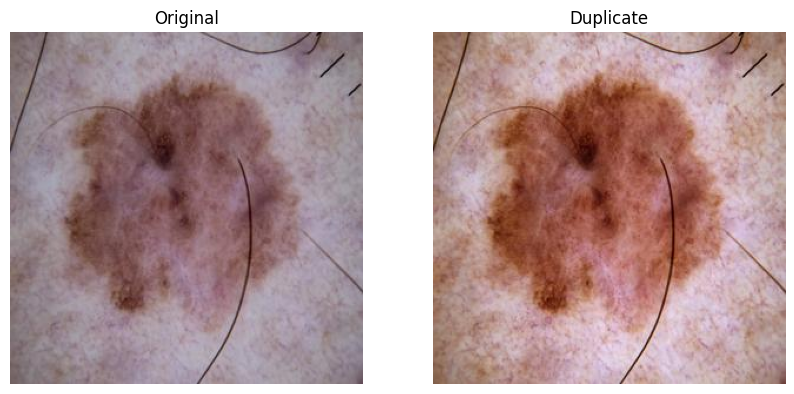

Number of duplicate images in test benign: 1


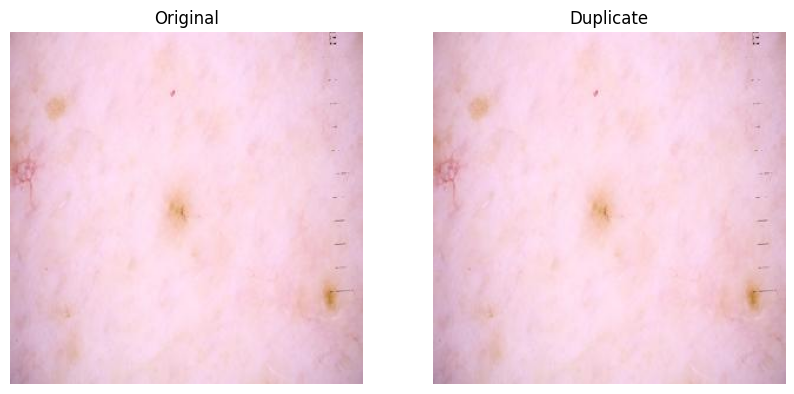

Number of duplicate images in test malignant: 0
Total images processed: 10605
Total duplicate images found: 27


In [ ]:
def find_duplicates(image_dir):
    image_hashes = {}  # Store image hashes
    duplicates = []     # Store duplicate image paths
    total_images = 0

    for filename in os.listdir(image_dir):
        if filename.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            img_path = os.path.join(image_dir, filename)
            try:
                with Image.open(img_path) as img:
                    hash = imagehash.phash(img)  # Calculate perceptual hash
                    if hash in image_hashes:
                        duplicates.append((image_hashes[hash], img_path))  # Store duplicate
                    else:
                        image_hashes[hash] = img_path  # Store unique hash
                    total_images += 1
            except Exception as e:
                print(f"Error processing image: {img_path}, error: {e}")

    return duplicates, total_images

def create_duprm_dataset(original_dir, target_dir, duplicates):
    """Creates a new dataset excluding the duplicate images."""
    if not os.path.exists(target_dir):
        os.makedirs(target_dir)

    duplicate_set = set(dup[1] for dup in duplicates)

    for root, dirs, files in os.walk(original_dir):
        for file in files:
            original_file_path = os.path.join(root, file)
            if original_file_path not in duplicate_set:
                relative_path = os.path.relpath(original_file_path, original_dir)
                target_file_path = os.path.join(target_dir, relative_path)
                target_file_dir = os.path.dirname(target_file_path)
                if not os.path.exists(target_file_dir):
                    os.makedirs(target_file_dir)
                shutil.copy2(original_file_path, target_file_path)

def save_duplicates_to_file(duplicates, filepath):
    """Saves the list of duplicates to a text file."""
    with open(filepath, 'w') as file:
        for original, duplicate in duplicates:
            file.write(f"Original: {original}\nDuplicate: {duplicate}\n\n")

# Paths to the dataset
train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/train'
test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/test'

# Subdirectories
categories = ['benign', 'malignant']

duprm_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_train'
duprm_test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_test'

datasets = [
    (train_dir, duprm_train_dir, 'train'),
    (test_dir, duprm_test_dir, 'test')
]

total_images_processed = 0
total_duplicates_found = 0

for original_dir, target_dir, dataset_name in datasets:
    for category in categories:
        original_category_dir = os.path.join(original_dir, category)
        target_category_dir = os.path.join(target_dir, category)
        duplicates, total_images = find_duplicates(original_category_dir)
        total_images_processed += total_images
        duplicate_count = len(duplicates)
        total_duplicates_found += duplicate_count
        print(f"Number of duplicate images in {dataset_name} {category}: {duplicate_count}")
        display_duplicate_images(duplicates)

        # Save duplicates to file
        duplicate_list_path = os.path.join(original_dir, f"{dataset_name}_{category}_duplicates.txt")
        save_duplicates_to_file(duplicates, duplicate_list_path)

        create_duprm_dataset(original_category_dir, target_category_dir, duplicates)

print(f"Total images processed: {total_images_processed}")
print(f"Total duplicate images found: {total_duplicates_found}")


###Duplicate Images Found : 26 in Train And 1 in Test

#Counting Images After Removing Duplicates

In [ ]:
# Count images in train and test directories
train_counts, train_total = count_images(duprm_train_dir, categories)
test_counts, test_total = count_images(duprm_test_dir, categories)

# Display the counts
print(f"Train Data: {train_counts}, Total: {train_total}")
print(f"Test Data: {test_counts}, Total: {test_total}")


Train Data: {'benign': 4992, 'malignant': 4587}, Total: 9579
Test Data: {'benign': 499, 'malignant': 500}, Total: 999


Thus The Train Data Has 9579 Images and Test Data Contains 999 Images

Total 10,578 Images After Removing The Duplicates

#Converting RGB Images To Grayscale

In [1]:
def convert_to_grayscale(image):
    return image.convert('L')  # Convert to grayscale

def process_and_save_images_with_pillow(input_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for root, dirs, files in os.walk(input_dir):
        for file in files:
            if file.endswith('.jpg'):
                img_path = os.path.join(root, file)
                image = Image.open(img_path)
                grayscale_image = convert_to_grayscale(image)
                # Keep original dimensions, no resizing

                # Save processed image as .jpg
                relative_path = os.path.relpath(root, input_dir)
                save_dir = os.path.join(output_dir, relative_path)
                if not os.path.exists(save_dir):
                    os.makedirs(save_dir)
                save_path = os.path.join(save_dir, file)

                # Save the grayscale image directly
                grayscale_image.save(save_path, 'JPEG')

                print(f"Processed and saved {save_path}")

# Define dataset directories
train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_train'
test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_test'
grayimages_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_train'
grayimages_test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_test'

# Process and save grayscale images using Pillow
process_and_save_images_with_pillow(train_dir, grayimages_train_dir)
process_and_save_images_with_pillow(test_dir, grayimages_test_dir)

print("Grayscale datasets created successfully with Pillow while maintaining original dimensions.")



Grayscale datasets created successfully with Pillow while maintaining original dimensions.


##Comparing Original And Grayscale Images

Displaying original and grayscale images from the train dataset:


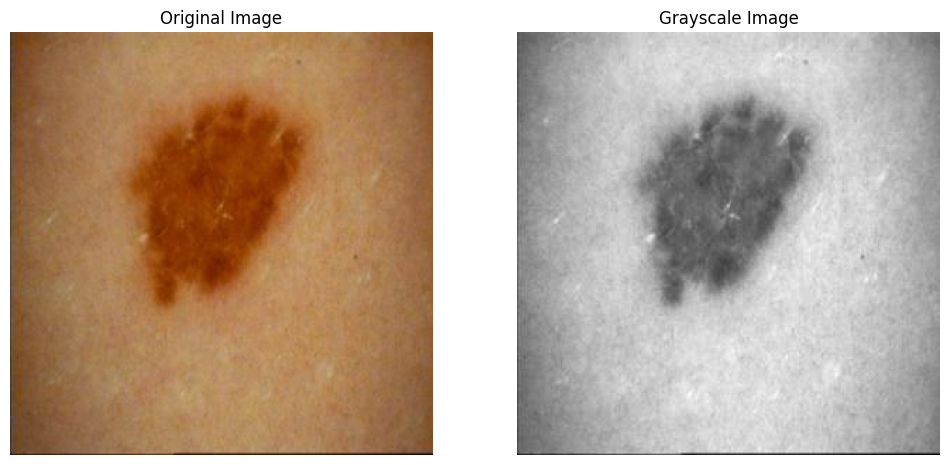

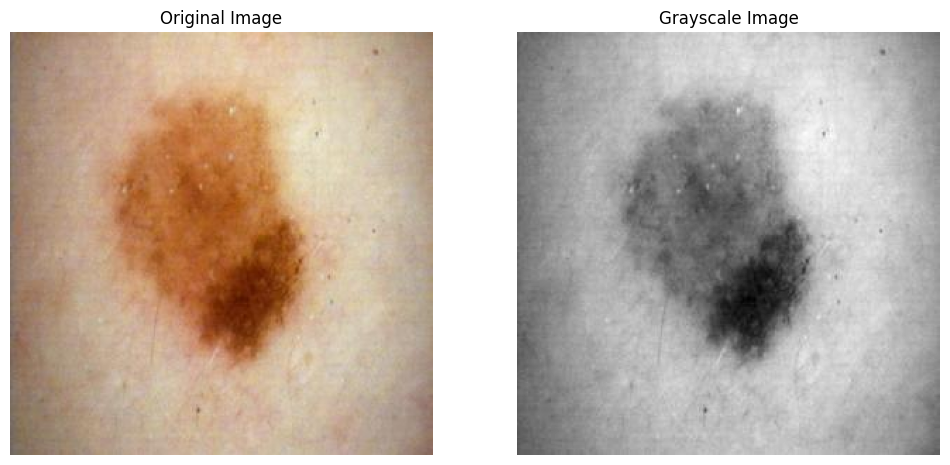

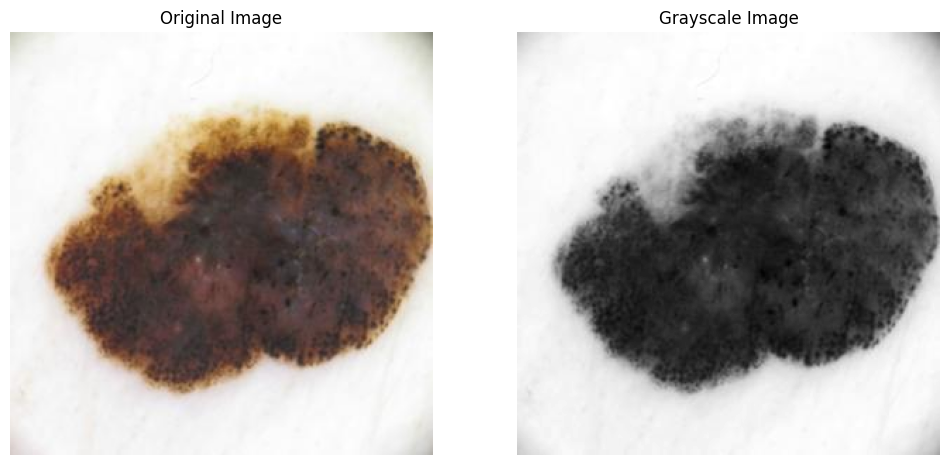

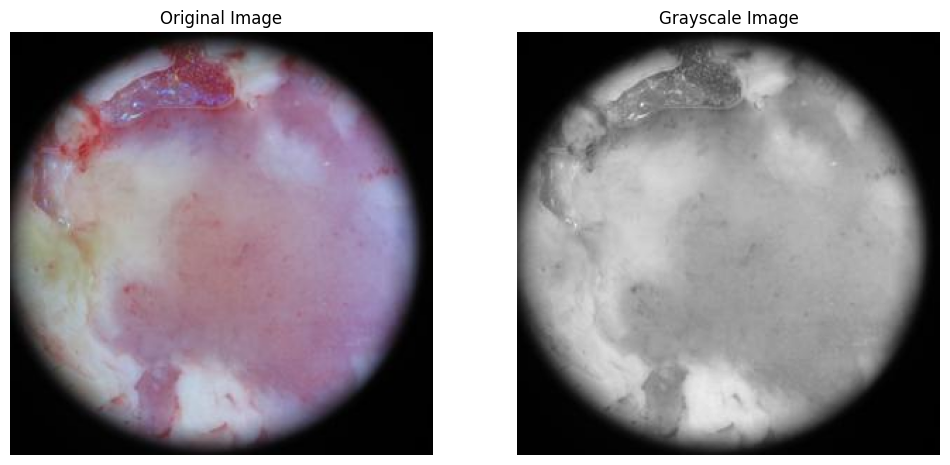

Displaying original and grayscale images from the test dataset:


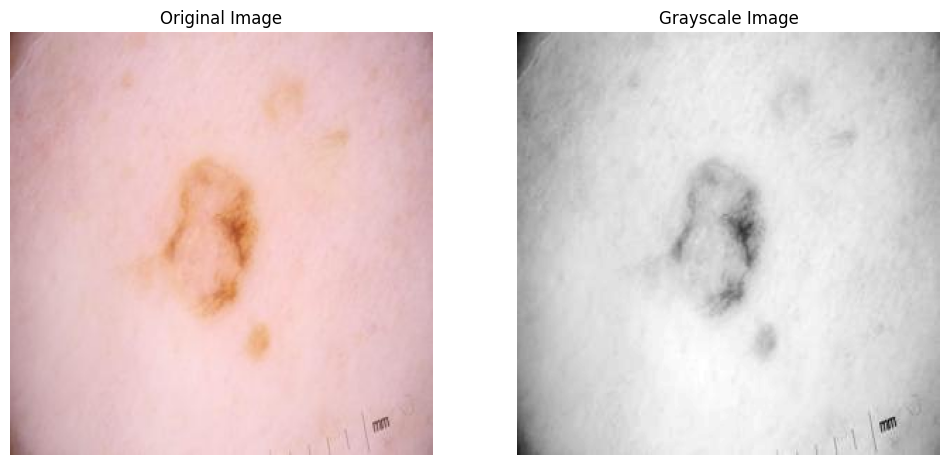

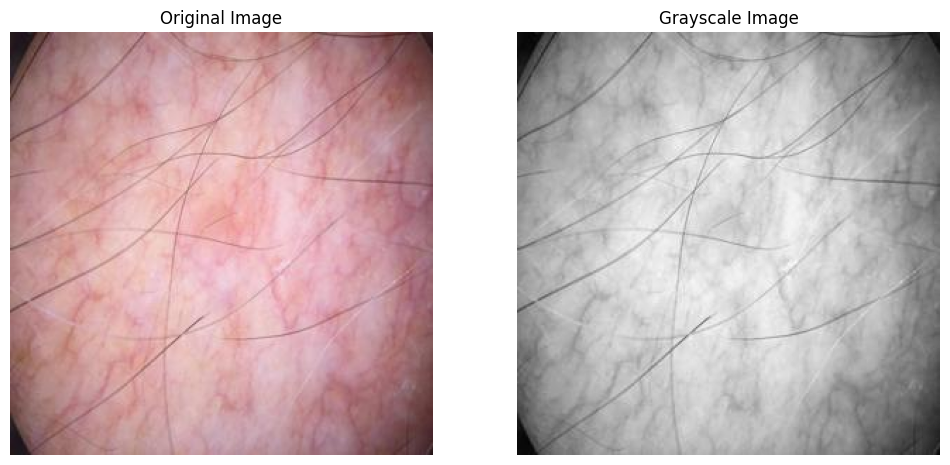

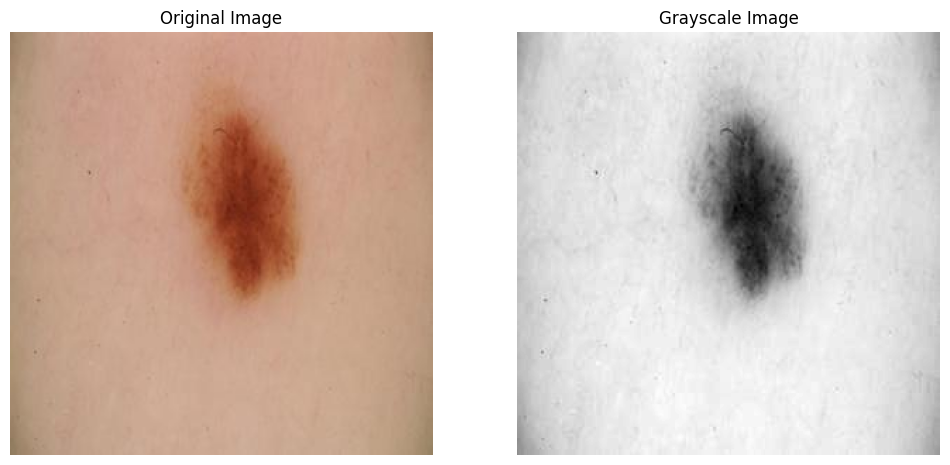

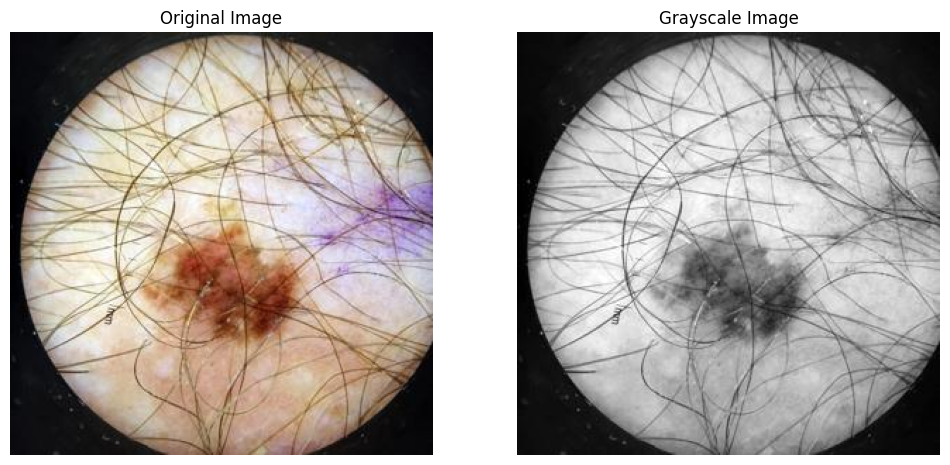

In [ ]:
def display_comparison(original_dir, grayimages_dir, num_samples=2):
    categories = ['benign', 'malignant']

    for category in categories:
        image_files = []
        category_dir = os.path.join(original_dir, category)

        for root, dirs, files in os.walk(category_dir):
            for file in files:
                if file.endswith('.jpg'):  # Only .jpg files as mentioned
                    image_files.append(os.path.join(root, file))

        if not image_files:
            print(f"No images found in the {category} category.")
            continue

        # Display the specified number of sample images for the current category
        for i in range(min(num_samples, len(image_files))):
            orig_img_path = image_files[i]
            rel_path = os.path.relpath(orig_img_path, original_dir)
            grayimages_img_path = os.path.join(grayimages_dir, rel_path).replace('.png', '.jpg').replace('.jpeg', '.jpg').replace('.bmp', '.jpg').replace('.tiff', '.jpg')

            # Load the original image
            original_image = Image.open(orig_img_path).convert('RGB')

            # Load the grayscale image
            if os.path.exists(grayimages_img_path):
                grayimages_image = Image.open(grayimages_img_path)

                # Plot the images side by side
                fig, axes = plt.subplots(1, 2, figsize=(12, 6))

                axes[0].imshow(original_image)
                axes[0].set_title('Original Image')
                axes[0].axis('off')

                axes[1].imshow(grayimages_image, cmap='gray')
                axes[1].set_title('Grayscale Image')
                axes[1].axis('off')

                plt.show()
            else:
                print(f"Grayscale image not found for: {rel_path}")

# Define dataset directories
train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_train'
grayimages_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_train'
test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_test'
grayimages_test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_test'

# Display original and grayscale images from the train dataset
print("Displaying original and grayscale images from the train dataset:")
display_comparison(train_dir, grayimages_train_dir)

# Display original and grayscale images from the test dataset
print("Displaying original and grayscale images from the test dataset:")
display_comparison(test_dir, grayimages_test_dir)



#Image Augmentation
###Technique used to artificially expand the size and diversity of a training dataset by creating modified versions of images in the dataset.

###Here We Create 5 Images For Each Image

###Storing The Augmented Image Into Another Dataset


###Greyscale Augmented Images

In [ ]:
import os
import numpy as np
from PIL import Image, UnidentifiedImageError
import imgaug.augmenters as iaa
from tqdm import tqdm
import logging

# Setup logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
def augment_image(image):
    seq = iaa.Sequential([
        iaa.Affine(rotate=(-30, 30)),   # Rotation
        iaa.Fliplr(0.5),                # Horizontal Flip
        iaa.Crop(percent=(0, 0.1)),     # Random Cropping
        iaa.Multiply((0.8, 1.2)),       # Brightness Change
        iaa.AdditiveGaussianNoise(scale=(0, 0.05*255))  # Gaussian Noise
    ])
    return [seq(image=image) for _ in range(5)]
def process_image(file_path, save_dir, input_dir):
    try:
        # Use the correct method to open a grayscale image
        image = np.array(Image.open(file_path).convert('L'))

        # Ensure image is in uint8 format
        if image.dtype != np.uint8:
            image = (image * 255).astype(np.uint8)

        # Apply augmentations
        augmented_images = augment_image(image)

        # Save original image
        relative_path = os.path.relpath(file_path, input_dir)
        orig_save_path = os.path.join(save_dir, relative_path)
        orig_save_dir = os.path.dirname(orig_save_path)
        if not os.path.exists(orig_save_dir):
            os.makedirs(orig_save_dir)
        Image.fromarray(image).save(orig_save_path)

        # Save augmented images
        for i, aug_image in enumerate(augmented_images):
            aug_save_path = os.path.join(orig_save_dir, f"{os.path.basename(file_path).replace('.jpg', '')}_aug_{i + 1}.jpg")
            Image.fromarray(aug_image).save(aug_save_path)
        logging.info(f"Successfully processed {file_path}")
    except UnidentifiedImageError:
        logging.error(f"Error: Cannot process file {file_path}. It might be corrupted or in an unsupported format.")
    except Exception as e:
        logging.error(f"Error processing {file_path}: {e}")
def process_and_augment_images(input_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    files = []
    for root, dirs, files_list in os.walk(input_dir):
        for file in files_list:
            if file.endswith('.jpg'):
                files.append(os.path.join(root, file))

    for file_path in tqdm(files, desc="Processing images"):
        process_image(file_path, output_dir, input_dir)
def count_images_in_directory(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.jpg'):
                count += 1
    return count
# Define dataset directories
grayimages_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_train'
auggrayimage_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/auggrayimage_train'

# Process and augment images in grayimages_train directory
logging.info("Starting augmentation in the grayimages_train dataset")
process_and_augment_images(grayimages_train_dir, auggrayimage_train_dir)

# Verify the number of images
original_count = count_images_in_directory(grayimages_train_dir)
augmented_count = count_images_in_directory(auggrayimage_train_dir)

logging.info(f"Original images: {original_count}")
logging.info(f"Augmented images: {augmented_count}")

logging.info("Augmentation complete. Various augmented images per original image have been created in the auggrayimage dataset.")


Processing images: 100%|██████████| 9581/9581 [38:12<00:00,  4.18it/s]


In [ ]:
def count_images_by_class(directory):
    count_benign = 0
    count_malignant = 0

    for root, dirs, files in os.walk(directory):
        print(f'Checking directory: {root}')
        for file in files:
            if file.endswith('.jpg'):
                if 'benign' in root:
                    count_benign += 1
                elif 'malignant' in root:
                    count_malignant += 1
                else:
                    print(f"File {file} not classified in 'benign' or 'malignant'. Directory: {root}")

    return count_benign, count_malignant
# Define dataset directory
auggreyimage_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/auggrayimage_train'

# Count the images in the directory by class
benign_count, malignant_count = count_images_by_class(auggreyimage_train_dir)

print(f'Number of benign images in auggreyimage_train: {benign_count}')
print(f'Number of malignant images in auggreyimage_train: {malignant_count}')


Checking directory: /content/drive/MyDrive/melanoma_cancer_dataset/auggrayimage_train
Checking directory: /content/drive/MyDrive/melanoma_cancer_dataset/auggrayimage_train/malignant
Checking directory: /content/drive/MyDrive/melanoma_cancer_dataset/auggrayimage_train/benign
Number of benign images in auggreyimage_train: 29952
Number of malignant images in auggreyimage_train: 22163


##RGB Augmented Images

In [ ]:
import os
import numpy as np
from PIL import Image, UnidentifiedImageError
import imgaug.augmenters as iaa
import cv2
from tqdm import tqdm
import logging

# Setup logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
def augment_image(image):
    seq = iaa.Sequential([
        iaa.Pad(px=(10, 10, 10, 10), keep_size=False),  # Add padding to avoid black corners
        iaa.Affine(rotate=(-30, 30), translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}),  # Rotation and shifting
        iaa.CropToFixedSize(width=300, height=300),  # Crop to original size
        iaa.Fliplr(0.5),  # Horizontal flip
        iaa.Multiply((0.8, 1.2)),  # Color jittering
        iaa.AdditiveGaussianNoise(scale=(0, 0.05*255))  # Gaussian noise
    ])
    return [seq(image=image) for _ in range(5)]
def process_image(file_path, save_dir, input_dir):
    try:
        logging.info(f"Processing file: {file_path}")

        # Open the color image
        image = Image.open(file_path).convert('RGB')
        logging.info(f"Loaded image: {file_path}")

        # Convert to NumPy array
        image = np.array(image)
        logging.info(f"Image converted to NumPy array with shape: {image.shape} and dtype: {image.dtype}")

        # Ensure image is in uint8 format
        if image.dtype != np.uint8:
            image = (image * 255).astype(np.uint8)
        logging.info(f"Image dtype corrected to: {image.dtype}")

        # Apply augmentations
        augmented_images = augment_image(image)

        # Determine the class directory (benign or malignant)
        relative_path = os.path.relpath(file_path, input_dir)
        class_dir = os.path.split(relative_path)[0]  # Get the class folder

        # Save original image
        orig_save_path = os.path.join(save_dir, relative_path)
        orig_save_dir = os.path.dirname(orig_save_path)
        if not os.path.exists(orig_save_dir):
            os.makedirs(orig_save_dir)
        Image.fromarray(image).save(orig_save_path)

        # Save augmented images
        for i, aug_image in enumerate(augmented_images):
            aug_save_path = os.path.join(save_dir, class_dir, f"{os.path.basename(file_path).replace('.jpg', '')}_aug_{i + 1}.jpg")
            Image.fromarray(aug_image).save(aug_save_path)
        logging.info(f"Successfully processed {file_path}")

    except UnidentifiedImageError:
        logging.error(f"Error: Cannot process file {file_path}. It might be corrupted or in an unsupported format.")
    except Exception as e:
        logging.error(f"Error processing {file_path}: {e}")
def process_and_augment_images(input_dir, output_dir):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    files = []
    for root, dirs, files_list in os.walk(input_dir):
        for file in files_list:
            if file.endswith('.jpg'):
                files.append(os.path.join(root, file))

    for file_path in tqdm(files, desc="Processing images"):
        process_image(file_path, output_dir, input_dir)
def count_images_in_directory(directory):
    count = 0
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.jpg'):
                count += 1
    return count
# Define dataset directories
duprm_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_train'
augduprm_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/augduprm_train'

# Process and augment images in duprm_train directory
logging.info("Starting augmentation in the duprm_train dataset")
process_and_augment_images(duprm_train_dir, augduprm_train_dir)

# Verify the number of images
original_count = count_images_in_directory(duprm_train_dir)
augmented_count = count_images_in_directory(augduprm_train_dir)

logging.info(f"Original images: {original_count}")
logging.info(f"Augmented images: {augmented_count}")

logging.info("Augmentation complete. Various augmented images per original image have been created in the augduprm dataset.")

Processing images:  53%|█████▎    | 5063/9581 [17:17<26:49,  2.81it/s]

##Displaying The Original, Greyscaled-Normalised And Augmented Images

Displaying benign images from the train dataset:


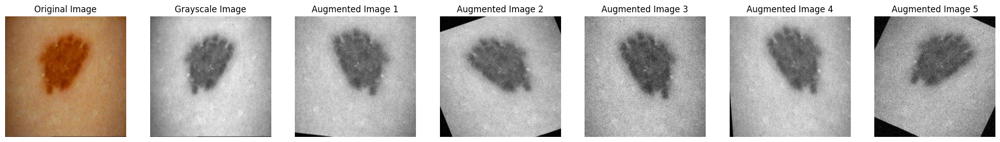

Displaying malignant images from the train dataset:


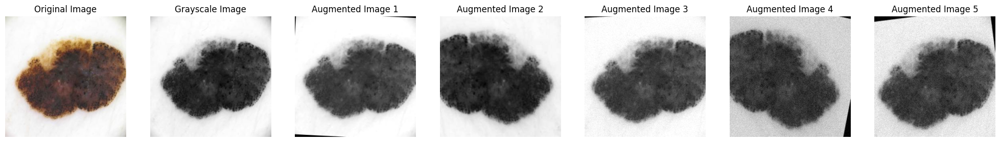

Displaying benign images from the test dataset:


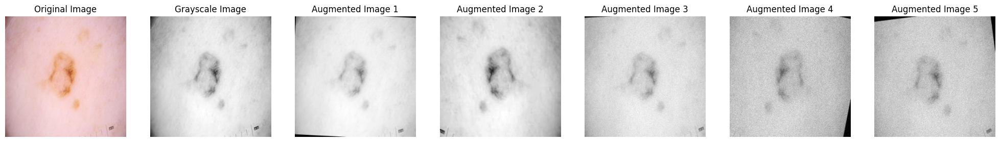

Displaying malignant images from the test dataset:


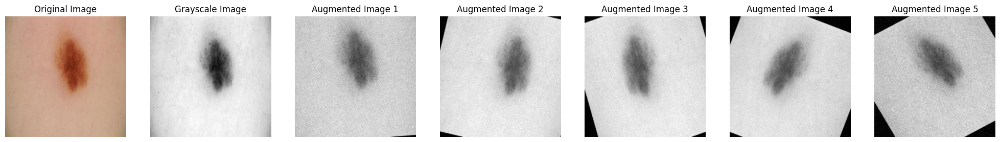

In [ ]:
def display_images(original_dir, grayimages_dir, auggreyimage_dir, category, num_samples=1):
    """Display original, grayscale, and augmented images side by side."""
    image_files = []
    category_dir = os.path.join(original_dir, category)

    for root, dirs, files in os.walk(category_dir):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
                image_files.append(os.path.join(root, file))

    if not image_files:
        print(f"No images found in the {category} category of the original dataset.")
        return

    # Display the specified number of sample images
    for i in range(min(num_samples, len(image_files))):
        orig_img_path = image_files[i]
        rel_path = os.path.relpath(orig_img_path, original_dir)

        # Paths to grayimages and auggreyimage images
        grayimages_img_path = os.path.join(grayimages_dir, rel_path).replace('.png', '.jpg').replace('.jpeg', '.jpg').replace('.bmp', '.jpg').replace('.tiff', '.jpg')
        auggreyimage_img_dir = os.path.join(auggreyimage_dir, os.path.dirname(rel_path))
        auggreyimage_images = [os.path.join(auggreyimage_img_dir, f"{os.path.splitext(os.path.basename(rel_path))[0]}_aug_{j + 1}.jpg") for j in range(5)]

        # Load the original image
        original_image = cv2.imread(orig_img_path)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert to RGB for displaying

        # Load the grayscale image
        if os.path.exists(grayimages_img_path):
            grayimages_image = Image.open(grayimages_img_path)

            # Plot the original, grayscale, and augmented images
            fig, axes = plt.subplots(1, 7, figsize=(25, 10))

            axes[0].imshow(original_image)
            axes[0].set_title('Original Image')
            axes[0].axis('off')

            axes[1].imshow(np.asarray(grayimages_image), cmap='gray')
            axes[1].set_title('Grayscale Image')
            axes[1].axis('off')

            # Load and plot augmented images
            for j in range(5):
                if os.path.exists(auggreyimage_images[j]):
                    aug_image = cv2.imread(auggreyimage_images[j], cv2.IMREAD_GRAYSCALE)
                    axes[j + 2].imshow(aug_image, cmap='gray')
                    axes[j + 2].set_title(f'Augmented Image {j + 1}')
                    axes[j + 2].axis('off')

            plt.show()
        else:
            print(f"Grayscale image not found for: {rel_path}")

# Define dataset directories for train and test datasets
train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_train'
grayimages_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_train'
auggreyimage_train_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/auggreyimage_train'
test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_test'
grayimages_test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_test'
auggreyimage_test_dir = '/content/drive/MyDrive/melanoma_cancer_dataset/auggreyimage_test'

# Display benign images from the train dataset
print("Displaying benign images from the train dataset:")
display_images(train_dir, grayimages_train_dir, auggreyimage_train_dir, category='benign', num_samples=1)

# Display malignant images from the train dataset
print("Displaying malignant images from the train dataset:")
display_images(train_dir, grayimages_train_dir, auggreyimage_train_dir, category='malignant', num_samples=1)

# Display benign images from the test dataset
print("Displaying benign images from the test dataset:")
display_images(test_dir, grayimages_test_dir, auggreyimage_test_dir, category='benign', num_samples=1)

# Display malignant images from the test dataset
print("Displaying malignant images from the test dataset:")
display_images(test_dir, grayimages_test_dir, auggreyimage_test_dir, category='malignant', num_samples=1)



#Visualizing Datasets

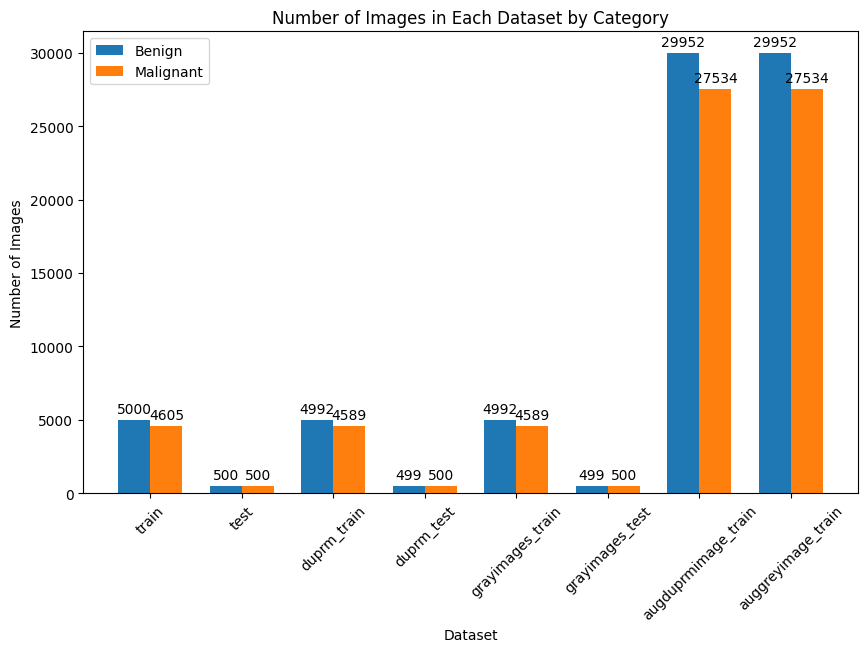

In [ ]:
def count_images_by_category(directory):
    """Count the number of images in each category (benign and malignant) within a directory."""
    categories = ['benign', 'malignant']
    counts = {category: 0 for category in categories}

    for category in categories:
        category_dir = os.path.join(directory, category)
        if os.path.exists(category_dir):
            for root, _, files in os.walk(category_dir):
                for file in files:
                    if file.endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff', '.npy')):
                        counts[category] += 1
    return counts

# Define dataset directories
datasets = {
    'train': '/content/drive/MyDrive/melanoma_cancer_dataset/train',
    'test': '/content/drive/MyDrive/melanoma_cancer_dataset/test',
    'duprm_train': '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_train',
    'duprm_test': '/content/drive/MyDrive/melanoma_cancer_dataset/duprm_test',
    'grayimages_train': '/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_train',
    'grayimages_test': '/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_test',
    'augduprmimage_train': '/content/drive/MyDrive/melanoma_cancer_dataset/augduprm_train',
    'auggreyimage_train': '/content/drive/MyDrive/melanoma_cancer_dataset/auggrayimage_train'
}

# Count images in each dataset
detailed_counts = {name: count_images_by_category(path) for name, path in datasets.items()}

# Prepare data for plotting
categories = ['benign', 'malignant']
data = {category: [detailed_counts[dataset][category] for dataset in datasets] for category in categories}
dataset_names = list(datasets.keys())

# Plot the data
fig, ax = plt.subplots(figsize=(10, 6))
bar_width = 0.35
index = np.arange(len(dataset_names))

# Plot benign and malignant counts side by side
for i, category in enumerate(categories):
    bar = ax.bar(index + i * bar_width, data[category], bar_width, label=category.capitalize())

# Add labels and title
ax.set_xlabel('Dataset')
ax.set_ylabel('Number of Images')
ax.set_title('Number of Images in Each Dataset by Category')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(dataset_names)
ax.legend()

# Display counts on top of bars
for bar in ax.patches:
    height = bar.get_height()
    ax.annotate(f'{height}', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3), textcoords='offset points', ha='center', va='bottom')

plt.xticks(rotation=45)
plt.show()

The datasets are well-structured and balanced, removing duplicates, normalizing images, and significantly increasing size through augmentation. The "auggrey" datasets(Augmented Images), with 30,000 images per category, enhance model robustness. Benign and malignant images are evenly represented, providing a comprehensive foundation for training and evaluation.

##We are building a Convolutional Neural Network (CNN) model because CNNs excel at handling image data.

##For our melanoma cancer detection task, a CNN can distinguish between benign and malignant skin lesions based on their visual characteristics, potentially aiding in early and accurate diagnosis

#Model 1 - Training Model Using Original Dataset

##Load and Preprocess Data

In [ ]:
train_dir=
test_dir=
# Create ImageDataGenerator for data augmentation and normalization
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load and preprocess train and test datasets
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(128, 128),
    color_mode='rgb',
    batch_size=32,
    class_mode='binary'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(128, 128),
    color_mode='rgb',
    batch_size=32,
    class_mode='binary'
)


Found 9605 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


##Build the CNN Model

In [ ]:
model = Sequential([
    Input(shape=(128, 128, 1)),  # Define the input shape using the Input layer
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])
model.summary()



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      12,845,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,938,753 (49.36 MB)

 Trainable params: 12,938,753 (49.36 MB)

 Non-trainable params: 0 (0.00 B)

##Compile the Model

In [ ]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])


##Train the Model

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=10,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size
)

In [ ]:
loss, accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {accuracy * 100:.2f}%")


32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 373ms/step - accuracy: 0.8823 - loss: 0.2414
Test Accuracy: 87.60%


We trained the model for 20 epochs using a training dataset of melanoma images.

The model was evaluated on a test dataset, achieving a test accuracy of 87.60%.

##Visualizing Model Accuracy And Loss

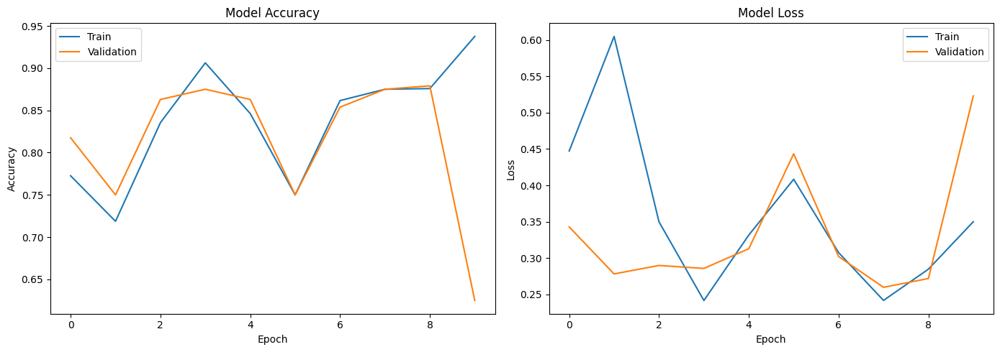

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

# Show plots
plt.tight_layout()
plt.show()


Both training and validation accuracy fluctuated during epochs, with training accuracy generally higher than validation accuracy. This suggests some level of overfitting, but overall the model performed well.

##Confusion Matrix

32/32 ━━━━━━━━━━━━━━━━━━━━ 12s 380ms/step
Confusion Matrix:
[[274 226]
 [270 230]]


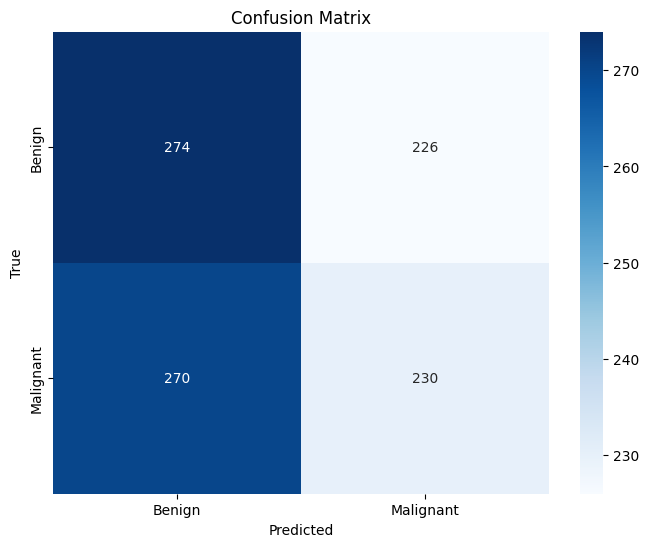

In [ ]:
# Get true labels and predictions
y_true = test_generator.classes
y_pred = model.predict(test_generator, steps=len(test_generator))
y_pred_binary = np.where(y_pred > 0.5, 1, 0).flatten()

# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred_binary)
print("Confusion Matrix:")
print(cm)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Benign", "Malignant"], yticklabels=["Benign", "Malignant"])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()



The model is fairly balanced with a notable number of both correct and
incorrect predictions.

## Model : RGB Images and The Duplicate Images Are Removed

In [ ]:
model = Sequential([
    Conv2D(64, (3, 3), activation='relu', input_shape=(128, 128, 1)),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Conv2D(256, (3, 3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

model.summary()


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)                    │ (None, 126, 126, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 126, 126, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 63, 63, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 61, 61, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 61, 61, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 30, 30, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 28, 28, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 28, 28, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 14, 14, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 50176)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 512)                 │      25,690,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,065,793 (99.43 MB)

 Trainable params: 26,063,873 (99.43 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [ ]:
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer,
              loss='binary_crossentropy',
              metrics=['accuracy'])


##Model Training

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,
    epochs=20,
    validation_data=test_generator,
    validation_steps=validation_steps
)


Epoch 1/20
74/74 ━━━━━━━━━━━━━━━━━━━━ 53s 588ms/step - accuracy: 0.8214 - loss: 0.6864 - val_accuracy: 0.5379 - val_loss: 0.6855
Epoch 2/20
74/74 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.9141 - loss: 0.2814 - val_accuracy: 0.5243 - val_loss: 0.7016
Epoch 3/20
74/74 ━━━━━━━━━━━━━━━━━━━━ 41s 506ms/step - accuracy: 0.8802 - loss: 0.2845 - val_accuracy: 0.5993 - val_loss: 0.8079
Epoch 4/20
74/74 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8594 - loss: 0.3165 - val_accuracy: 0.5631 - val_loss: 0.8037
Epoch 5/20
74/74 ━━━━━━━━━━━━━━━━━━━━ 42s 512ms/step - accuracy: 0.8945 - loss: 0.2564 - val_accuracy: 0.7288 - val_loss: 0.6324
Epoch 6/20
74/74 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9375 - loss: 0.1583 - val_accuracy: 0.7379 - val_loss: 0.5753
Epoch 7/20
74/74 ━━━━━━━━━━━━━━━━━━━━ 41s 500ms/step - accuracy: 0.9027 - loss: 0.2232 - val_accuracy: 0.6395 - val_loss: 0.7936
Epoch 8/20
74/74 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8828 - loss: 0.2662 - val_accuracy: 0.67

##Testing The Model

In [ ]:
loss, accuracy = model.evaluate(test_generator, steps=validation_steps)
print(f"Test Accuracy: {accuracy * 100:.2f}%")


7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 437ms/step - accuracy: 0.8657 - loss: 0.3146
Test Accuracy: 87.95%


##Confusion Matrix

In [ ]:
# Get true labels and predictions
y_true = test_generator.classes

# Ensure generator is not looping indefinitely
y_pred = model.predict(test_generator, steps=test_generator.n // test_generator.batch_size + 1)

# Convert predictions to binary values
y_pred_binary = np.where(y_pred > 0.5, 1, 0).flatten()

# Ensure y_pred_binary matches y_true length
y_pred_binary = y_pred_binary[:len(y_true)]


8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 559ms/step


Confusion Matrix:
[[238 261]
 [231 269]]

Classification Report:
              precision    recall  f1-score   support

      Benign       0.51      0.48      0.49       499
   Malignant       0.51      0.54      0.52       500

    accuracy                           0.51       999
   macro avg       0.51      0.51      0.51       999
weighted avg       0.51      0.51      0.51       999



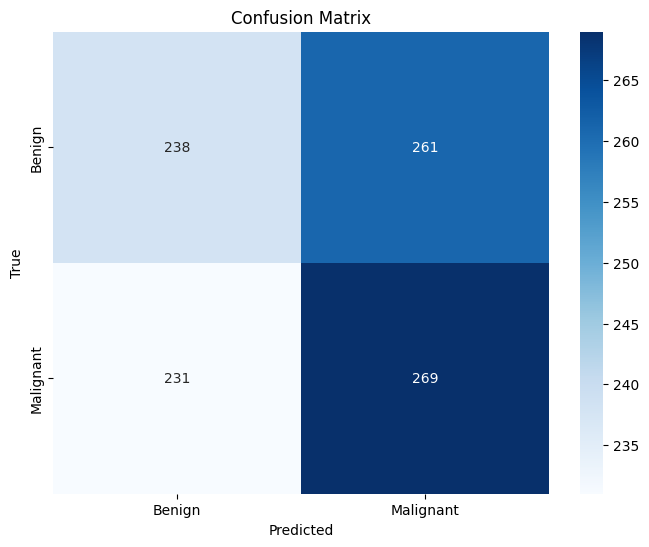

In [ ]:
# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred_binary)
print("Confusion Matrix:")
print(cm)

# Calculate classification report
report = classification_report(y_true, y_pred_binary, target_names=["Benign", "Malignant"])
print("\nClassification Report:")
print(report)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Benign", "Malignant"], yticklabels=["Benign", "Malignant"])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


###Visualising Model Accuracy and Loss

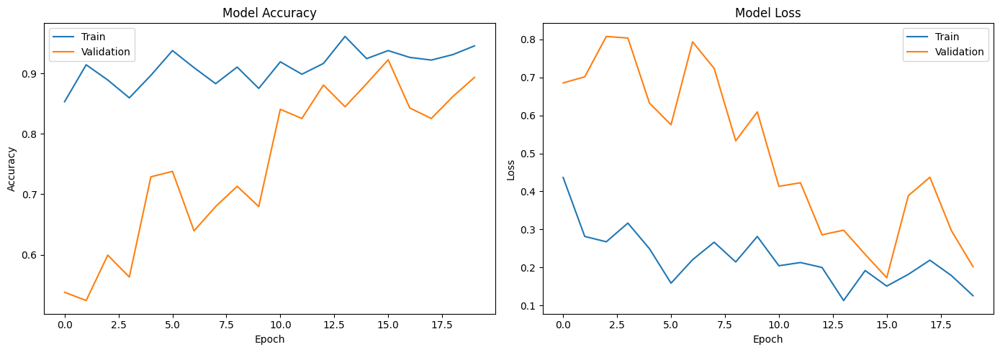

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper right')

# Show plots
plt.tight_layout()
plt.show()


###Model : Without Duplicate Images

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt


In [ ]:
# Define image data generators for training and validation datasets
train_datagen = ImageDataGenerator(rescale=1./255,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory('/content/drive/MyDrive/melanoma_cancer_dataset/duprm_train',
                                                    target_size=(300, 300),
                                                    batch_size=32,
                                                    class_mode='binary')

validation_generator = test_datagen.flow_from_directory('/content/drive/MyDrive/melanoma_cancer_dataset/duprm_test',
                                                        target_size=(300, 300),
                                                        batch_size=32,
                                                        class_mode='binary')


In [ ]:
model = Sequential()

# Input Layer
model.add(Input(shape=(300, 300, 3)))

# Convolutional Layer 1
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())

# Convolutional Layer 2
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())

# Convolutional Layer 3
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())

# Flatten the layers
model.add(Flatten())

# Fully Connected Layer 1
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))

# Fully Connected Layer 2
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))

# Output Layer
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 298, 298, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 149, 149, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 149, 149, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 147, 147, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 73, 73, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 73, 73, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 71, 71, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 35, 35, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 35, 35, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 156800)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │      40,141,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 40,268,225 (153.61 MB)

 Trainable params: 40,267,777 (153.61 MB)

 Non-trainable params: 448 (1.75 KB)

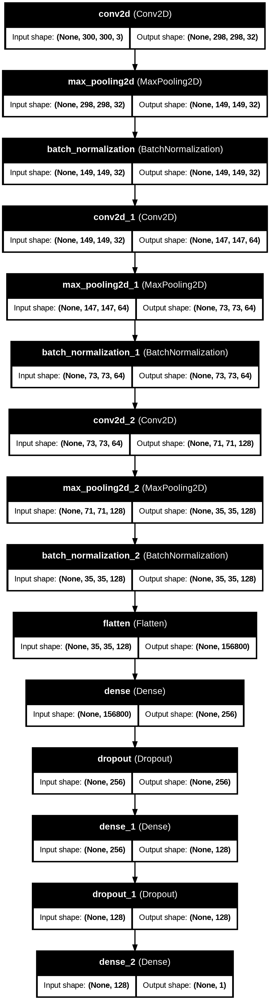

In [ ]:
# Plot the model architecture
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)
from IPython.display import Image
Image(filename='model_plot.png')


In [ ]:
# Train the model
history = model.fit(train_generator,
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                    validation_data=validation_generator,
                    validation_steps=validation_generator.samples // validation_generator.batch_size,
                    epochs=25)


Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


299/299 ━━━━━━━━━━━━━━━━━━━━ 2106s 7s/step - accuracy: 0.7561 - loss: 17.2360 - val_accuracy: 0.5000 - val_loss: 0.8649
Epoch 2/25
  1/299 ━━━━━━━━━━━━━━━━━━━━ 35s 120ms/step - accuracy: 0.7188 - loss: 3.1770

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


299/299 ━━━━━━━━━━━━━━━━━━━━ 14s 45ms/step - accuracy: 0.7188 - loss: 3.1770 - val_accuracy: 0.5714 - val_loss: 0.7633
Epoch 3/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 237s 761ms/step - accuracy: 0.7702 - loss: 2.7674 - val_accuracy: 0.8589 - val_loss: 0.4957
Epoch 4/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 0s 96us/step - accuracy: 0.7500 - loss: 0.3760 - val_accuracy: 0.7143 - val_loss: 0.4094
Epoch 5/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 262s 761ms/step - accuracy: 0.7888 - loss: 1.3132 - val_accuracy: 0.8125 - val_loss: 0.5887
Epoch 6/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.7500 - loss: 0.3867 - val_accuracy: 0.8571 - val_loss: 0.3567
Epoch 7/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 238s 778ms/step - accuracy: 0.8133 - loss: 0.8897 - val_accuracy: 0.8780 - val_loss: 0.2939
Epoch 8/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 0s 76us/step - accuracy: 0.8438 - loss: 0.4024 - val_accuracy: 1.0000 - val_loss: 0.0788
Epoch 9/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 233s 759ms/step - accuracy: 0.8270 - loss: 0.4668 - val_ac

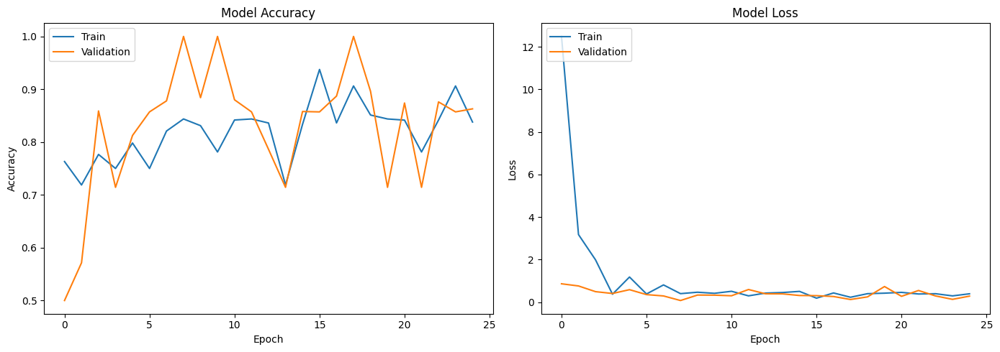

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(validation_generator, steps=validation_generator.samples // validation_generator.batch_size)
print(f'Test accuracy: {test_accuracy:.2f}')


31/31 ━━━━━━━━━━━━━━━━━━━━ 6s 199ms/step - accuracy: 0.8621 - loss: 0.2877
Test accuracy: 0.86



##Model : Unique Grey Images

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt


In [ ]:
# Define image data generators for training and validation datasets without augmentation
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory('/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_train',
                                                    target_size=(300, 300),
                                                    batch_size=32,
                                                    color_mode='grayscale',
                                                    class_mode='binary')

validation_generator = test_datagen.flow_from_directory('/content/drive/MyDrive/melanoma_cancer_dataset/grayimages_test',
                                                        target_size=(300, 300),
                                                        batch_size=32,
                                                        color_mode='grayscale',
                                                        class_mode='binary')


Found 9581 images belonging to 2 classes.
Found 999 images belonging to 2 classes.


In [ ]:
model = Sequential()

# Input Layer
model.add(Input(shape=(300, 300, 1)))  # Grayscale images have 1 channel

# Convolutional Layer 1
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Convolutional Layer 2
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the layers
model.add(Flatten())

# Fully Connected Layer
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))

# Output Layer
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])


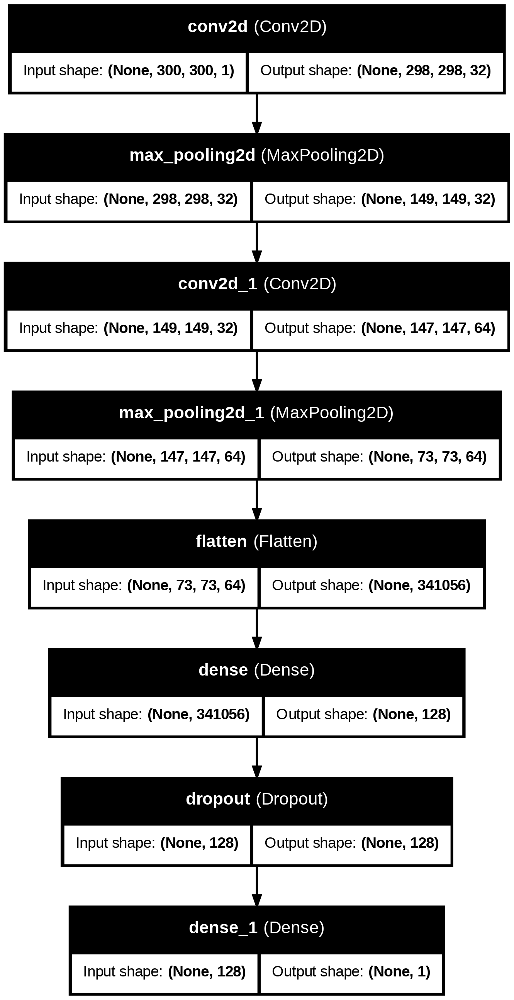

In [ ]:
# Plot the model architecture
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)
from IPython.display import Image
Image(filename='model_plot.png')


In [ ]:
# Train the model
history = model.fit(train_generator,
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                    validation_data=validation_generator,
                    validation_steps=validation_generator.samples // validation_generator.batch_size,
                    epochs=25)


Epoch 1/25


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


299/299 ━━━━━━━━━━━━━━━━━━━━ 116s 180ms/step - accuracy: 0.7000 - loss: 0.7184 - val_accuracy: 0.8659 - val_loss: 0.3056
Epoch 2/25
  1/299 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - accuracy: 0.7812 - loss: 0.3796

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


299/299 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7812 - loss: 0.3796 - val_accuracy: 0.7143 - val_loss: 0.4291
Epoch 3/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - accuracy: 0.8327 - loss: 0.3486 - val_accuracy: 0.8589 - val_loss: 0.2987
Epoch 4/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 0s 71us/step - accuracy: 0.8750 - loss: 0.3199 - val_accuracy: 0.5714 - val_loss: 0.6472
Epoch 5/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 82s 155ms/step - accuracy: 0.8569 - loss: 0.3235 - val_accuracy: 0.8669 - val_loss: 0.2954
Epoch 6/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 0s 65us/step - accuracy: 0.8750 - loss: 0.3628 - val_accuracy: 0.8571 - val_loss: 0.3017
Epoch 7/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 82s 154ms/step - accuracy: 0.8673 - loss: 0.2939 - val_accuracy: 0.8891 - val_loss: 0.2642
Epoch 8/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9062 - loss: 0.2710 - val_accuracy: 1.0000 - val_loss: 0.1181
Epoch 9/25
299/299 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - accuracy: 0.8711 - loss: 0.2966 - val_accuracy:

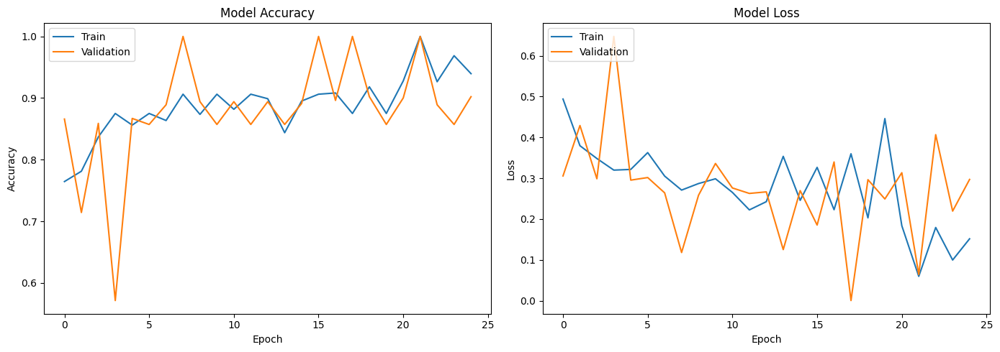

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(validation_generator, steps=validation_generator.samples // validation_generator.batch_size)
print(f'Test accuracy: {test_accuracy:.2f}')


31/31 ━━━━━━━━━━━━━━━━━━━━ 7s 234ms/step - accuracy: 0.8998 - loss: 0.3386
Test accuracy: 0.90


## Model : Unique Greyscaled Augmented Images

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Check TensorFlow version and GPU availability
print("TensorFlow version:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


# Ensure GPU is used if available
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


TensorFlow version: 2.17.0
Num GPUs Available:  0
Num GPUs Available:  0


In [ ]:
# Define dataset directories
train_dir = r"D:\Infosys Internship\MelanoAI\melanoma_cancer_dataset\auggrayimage_train"
test_dir = r"D:\Infosys Internship\MelanoAI\melanoma_cancer_dataset\grayimages_test"

# ImageDataGenerator for training and testing datasets
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(300, 300),
                                                    batch_size=16,
                                                    color_mode='grayscale',
                                                    class_mode='binary',
                                                    shuffle=True)

test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=(300, 300),
                                                  batch_size=16,
                                                  color_mode='grayscale',
                                                  class_mode='binary')



Found 57486 images belonging to 2 classes.
Found 999 images belonging to 2 classes.


In [ ]:
model = Sequential()
model.add(Input(shape=(300, 300, 1)))  # Explicitly define the input shape
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

model.summary()



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 298, 298, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 149, 149, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 149, 149, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 147, 147, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 73, 73, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 73, 73, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 71, 71, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 35, 35, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 35, 35, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 156800)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    40,141,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 40,234,881 (153.48 MB)

 Trainable params: 40,234,433 (153.48 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
history = model.fit(train_generator,
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                    validation_data=test_generator,
                    validation_steps=test_generator.samples // test_generator.batch_size,
                    epochs=25)


Epoch 1/25


C:\Users\Arumugam\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5178s 1s/step - accuracy: 0.7390 - loss: 1.2907 - val_accuracy: 0.8790 - val_loss: 0.4736
Epoch 2/25
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 62us/step - accuracy: 0.7500 - loss: 0.4545 - val_accuracy: 0.8571 - val_loss: 0.4702
Epoch 3/25


C:\Users\Arumugam\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5265s 1s/step - accuracy: 0.8149 - loss: 0.4171 - val_accuracy: 0.8589 - val_loss: 0.9716
Epoch 4/25
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 85us/step - accuracy: 0.9375 - loss: 0.2485 - val_accuracy: 0.8571 - val_loss: 0.2131
Epoch 5/25
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5827s 2s/step - accuracy: 0.8324 - loss: 0.3777 - val_accuracy: 0.8921 - val_loss: 0.4985
Epoch 6/25
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 99us/step - accuracy: 0.7500 - loss: 0.4189 - val_accuracy: 1.0000 - val_loss: 0.0584
Epoch 7/25
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5414s 1s/step - accuracy: 0.8501 - loss: 0.3434 - val_accuracy: 0.8911 - val_loss: 0.2773
Epoch 8/25
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 114us/step - accuracy: 0.8125 - loss: 0.3876 - val_accuracy: 0.7143 - val_loss: 0.3300
Epoch 9/25
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5265s 1s/step - accuracy: 0.8549 - loss: 0.3468 - val_accuracy: 0.8982 - val_loss: 1.1232
Epoch 10/25
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 72us/step - accuracy: 0.8750 - loss: 0.3450

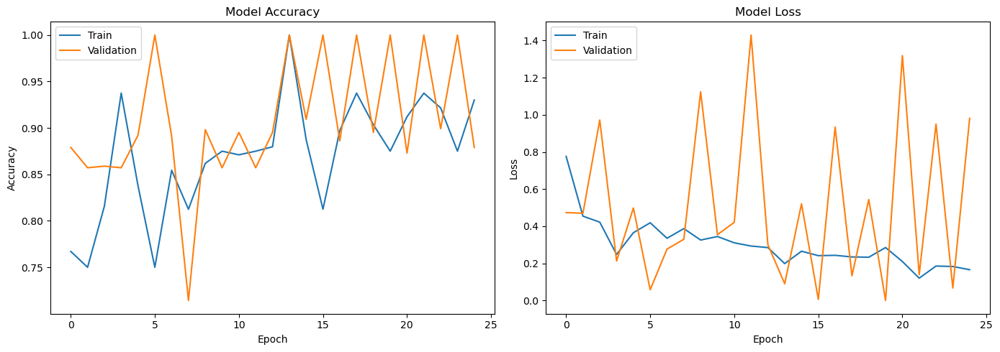

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


In [ ]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)
print(f'Test accuracy: {test_accuracy:.2f}')


62/62 ━━━━━━━━━━━━━━━━━━━━ 17s 274ms/step - accuracy: 0.8761 - loss: 0.7094
Test accuracy: 0.88


In [ ]:
# Save the entire model
model.save(r"D:\Infosys Internship\MelanoAI\models\greyaug.h5")
print("Model saved successfully!")


Model saved successfully!


##Model : RGB Augmented Images

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Check TensorFlow version
print("TensorFlow version:", tf.__version__)


TensorFlow version: 2.17.0


In [ ]:
# Define dataset directories
train_dir = r"D:\Infosys Internship\MelanoAI\melanoma_cancer_dataset\augduprm_train"
test_dir = r"D:\Infosys Internship\MelanoAI\melanoma_cancer_dataset\duprm_test"

# ImageDataGenerator for training and testing datasets
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(300, 300),
                                                    batch_size=16,
                                                    color_mode='rgb',
                                                    class_mode='binary',
                                                    shuffle=True)

test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=(300, 300),
                                                  batch_size=16,
                                                  color_mode='rgb',
                                                  class_mode='binary')



Found 57486 images belonging to 2 classes.
Found 999 images belonging to 2 classes.


In [ ]:
model = Sequential()
model.add(Input(shape=(300, 300, 3)))  # Explicitly define the input shape for RGB images

model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Dropout(0.25))  # Add dropout to prevent overfitting

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Dropout(0.5))

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 298, 298, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 149, 149, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 149, 149, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 149, 149, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 147, 147, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 73, 73, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 73, 73, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 73, 73, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 71, 71, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 35, 35, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 35, 35, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 35, 35, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 156800)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    40,141,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 40,235,457 (153.49 MB)

 Trainable params: 40,235,009 (153.48 MB)

 Non-trainable params: 448 (1.75 KB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Early stopping and learning rate reduction callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

history = model.fit(train_generator,
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                    validation_data=test_generator,
                    validation_steps=test_generator.samples // test_generator.batch_size,
                    epochs=50,  # Increased epochs for better training
                    callbacks=[early_stopping, reduce_lr])


Epoch 1/50


C:\Users\Arumugam\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5708s 2s/step - accuracy: 0.7774 - loss: 0.8099 - val_accuracy: 0.8891 - val_loss: 0.2643 - learning_rate: 1.0000e-04
Epoch 2/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 68us/step - accuracy: 0.8750 - loss: 0.3676 - val_accuracy: 0.8571 - val_loss: 0.5257 - learning_rate: 1.0000e-04


C:\Users\Arumugam\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


Epoch 3/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5391s 1s/step - accuracy: 0.8435 - loss: 0.3769 - val_accuracy: 0.8518 - val_loss: 0.3517 - learning_rate: 1.0000e-04
Epoch 4/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 84us/step - accuracy: 0.7500 - loss: 0.4182 - val_accuracy: 0.8571 - val_loss: 0.2787 - learning_rate: 1.0000e-04
Epoch 5/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5417s 2s/step - accuracy: 0.8639 - loss: 0.3296 - val_accuracy: 0.9002 - val_loss: 0.2581 - learning_rate: 1.0000e-04
Epoch 6/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 79us/step - accuracy: 0.8125 - loss: 0.3410 - val_accuracy: 0.8571 - val_loss: 0.5695 - learning_rate: 1.0000e-04
Epoch 7/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5468s 2s/step - accuracy: 0.8754 - loss: 0.3075 - val_accuracy: 0.8911 - val_loss: 0.2386 - learning_rate: 1.0000e-04
Epoch 8/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 86us/step - accuracy: 0.9375 - loss: 0.2235 - val_accuracy: 1.0000 - val_loss: 0.2160 - learning_rate: 1.0000e-04
Epoch 9/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5

In [ ]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)
print(f'Test accuracy: {test_accuracy:.2f}')


62/62 ━━━━━━━━━━━━━━━━━━━━ 17s 273ms/step - accuracy: 0.9184 - loss: 0.2322
Test accuracy: 0.91


This Model Has Acheived An Accuracy Of 92%

We Select This Model For Deployment

In [ ]:
# Save the trained model
model.save(r"D:\Infosys Internship\MelanoAI\models\rgbaug1.keras")
print("Model saved successfully!")


Model saved successfully!


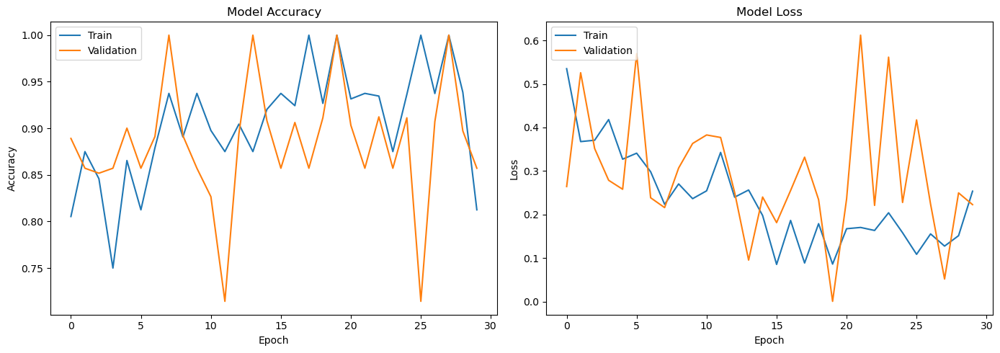

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


63/63 ━━━━━━━━━━━━━━━━━━━━ 18s 274ms/step


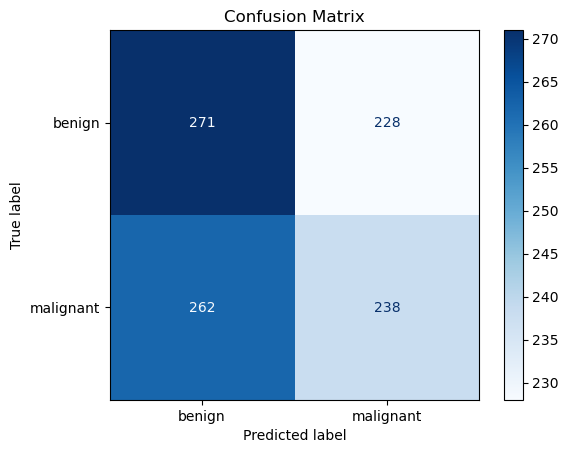

In [ ]:
# Assuming `test_generator` is your test data generator
y_true = test_generator.classes  # True labels

# Get the model predictions
y_pred = model.predict(test_generator)
y_pred = np.where(y_pred > 0.5, 1, 0)  # Convert probabilities to binary outcomes
# Generate the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_generator.class_indices.keys())
disp.plot(cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.show()


##Predicting Using Model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 322ms/step


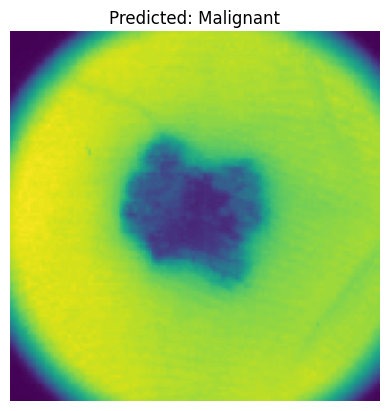

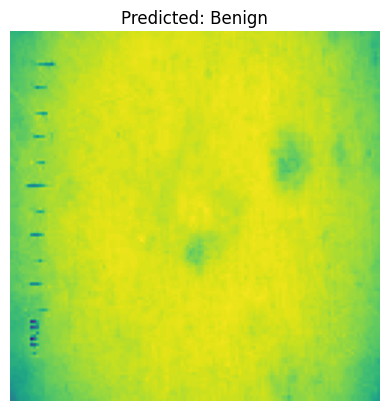

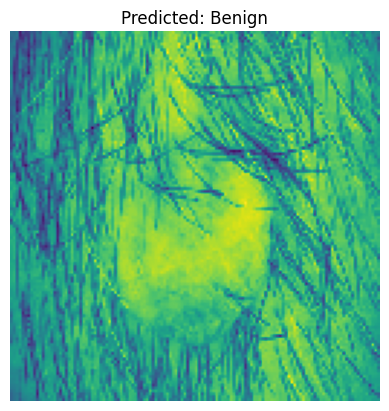

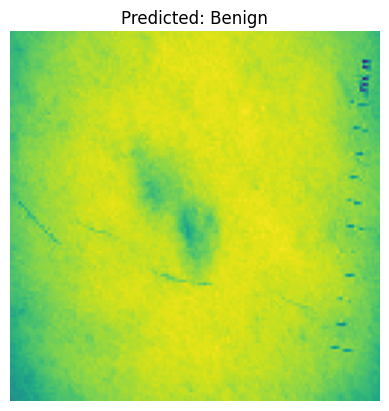

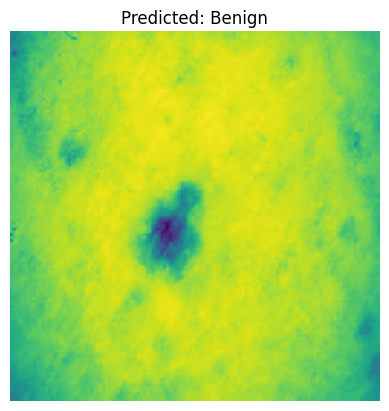

In [ ]:
# Example prediction on test set
import matplotlib.pyplot as plt

test_images, test_labels = next(test_generator)
predictions = model.predict(test_images)

# Display first 5 test images and their predicted labels
for i in range(5):
    plt.imshow(test_images[i])
    plt.title(f"Predicted: {'Malignant' if predictions[i] > 0.5 else 'Benign'}")
    plt.axis('off')
    plt.show()


##Model : VGG16 Model

Transfer Learning

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt

In [ ]:
# Define dataset directories
train_dir = r"D:\Infosys Internship\MelanoAI\melanoma_cancer_dataset\augduprm_train"
test_dir = r"D:\Infosys Internship\MelanoAI\melanoma_cancer_dataset\duprm_test"

# ImageDataGenerator for train and test datasets
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=(300, 300),
                                                    batch_size=16,
                                                    color_mode='rgb',  # RGB color mode
                                                    class_mode='binary',
                                                    shuffle=True)

test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=(300, 300),
                                                  batch_size=16,
                                                  color_mode='rgb',
                                                  class_mode='binary')


Found 57486 images belonging to 2 classes.
Found 999 images belonging to 2 classes.


In [ ]:
# Load pre-trained VGG16 model + higher level layers
base_model = VGG16(include_top=False, weights='imagenet', input_shape=(300, 300, 3))

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top
vgg16 = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    Dense(256, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

vgg16.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])
vgg16.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 17s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 9, 9, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,846,273 (56.63 MB)

 Trainable params: 131,585 (514.00 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
# Early stopping and learning rate reduction callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

history = model.fit(train_generator,
                    steps_per_epoch=train_generator.samples // train_generator.batch_size,
                    validation_data=test_generator,
                    validation_steps=test_generator.samples // test_generator.batch_size,
                    epochs=50,
                    callbacks=[early_stopping, reduce_lr])


Epoch 1/50


C:\Users\Arumugam\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5639s 2s/step - accuracy: 0.8487 - loss: 0.5608 - val_accuracy: 0.8871 - val_loss: 0.2724 - learning_rate: 1.0000e-05
Epoch 2/50
   1/3592 ━━━━━━━━━━━━━━━━━━━━ 1:27:10 1s/step - accuracy: 0.9375 - loss: 0.1980

C:\Users\Arumugam\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 103us/step - accuracy: 0.9375 - loss: 0.1980 - val_accuracy: 0.7143 - val_loss: 0.3944 - learning_rate: 1.0000e-05
Epoch 3/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 5720s 2s/step - accuracy: 0.8914 - loss: 0.2599 - val_accuracy: 0.9022 - val_loss: 0.2421 - learning_rate: 1.0000e-05
Epoch 4/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 92us/step - accuracy: 0.8750 - loss: 0.3736 - val_accuracy: 0.4286 - val_loss: 0.8916 - learning_rate: 1.0000e-05
Epoch 5/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 6061s 2s/step - accuracy: 0.9070 - loss: 0.2269 - val_accuracy: 0.8972 - val_loss: 0.2329 - learning_rate: 1.0000e-05
Epoch 6/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 2s 108us/step - accuracy: 1.0000 - loss: 0.0809 - val_accuracy: 0.8571 - val_loss: 0.2312 - learning_rate: 1.0000e-05
Epoch 7/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 3911s 1s/step - accuracy: 0.9119 - loss: 0.2147 - val_accuracy: 0.8992 - val_loss: 0.2325 - learning_rate: 1.0000e-05
Epoch 8/50
3592/3592 ━━━━━━━━━━━━━━━━━━━━ 20s 5ms/st

In [ ]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = vgg16.evaluate(test_generator, steps=test_generator.samples // test_generator.batch_size)
print(f'Test accuracy: {test_accuracy:.2f}')


62/62 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - accuracy: 0.4880 - loss: 1.7644
Test accuracy: 0.50


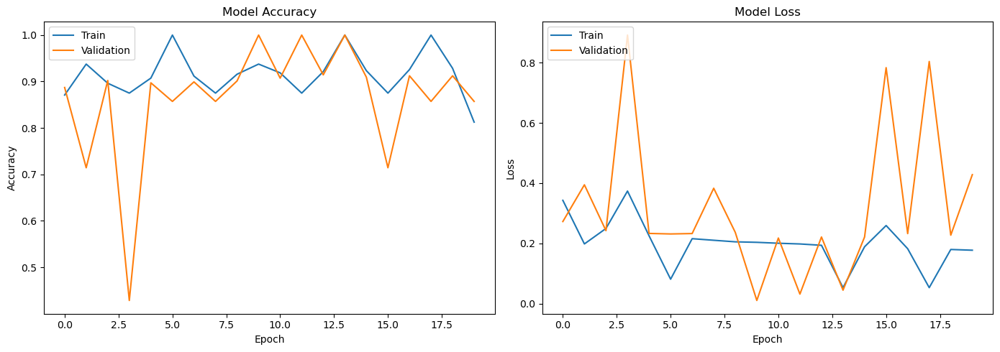

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

plt.tight_layout()
plt.show()


63/63 ━━━━━━━━━━━━━━━━━━━━ 319s 5s/step


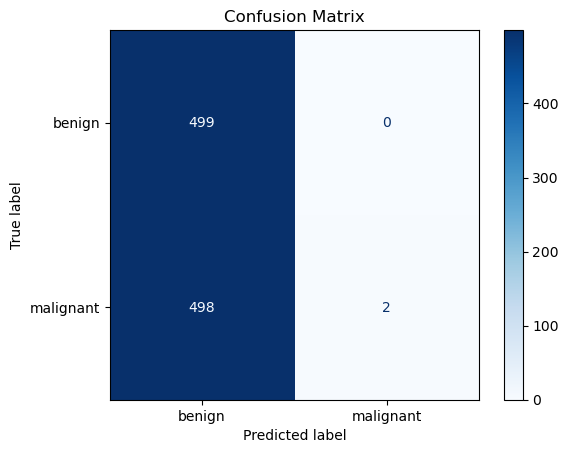

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get the model predictions
y_pred = vgg16.predict(test_generator)
y_pred = np.where(y_pred > 0.5, 1, 0)  # Convert probabilities to binary outcomes

# True labels
y_true = test_generator.classes

# Generate the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_generator.class_indices.keys())
disp.plot(cmap=plt.cm.Blues)

plt.title('Confusion Matrix')
plt.show()


##Summary Of The Models

In [ ]:
import pandas as pd
from IPython.display import display, HTML
# Define the data
data = {
    'Model': [
        'RGB With Duplicates',
        'RGB Without Duplicates',
        'Greyscale Without Duplicates',
        'Unique Augmented Greyscale',
        'Unique Augmented RGB',
        'VGG16'
    ],
    'Accuracy': [
        0.82,
        0.86,
        0.87,
        0.88,
        0.91,
        0.50
    ]
}

# Create a DataFrame
df = pd.DataFrame(data)

# Generate the HTML table with styling
html_table = df.to_html(index=False, classes='table table-striped table-hover')

# Define additional CSS styling
css = """
<style>
    .table {
        width: 80%;
        margin: 50px auto;
        border-collapse: collapse;
        font-family: Arial, sans-serif;
    }
    .table th, .table td {
        padding: 12px;
        border: 1px solid #ddd;
        text-align: center;
    }
    .table th {
        background-color: #f4f4f4;
        color: #333;
    }
    .table-striped tbody tr:nth-of-type(odd) {
        background-color: #f9f9f9;
    }
    .table-hover tbody tr:hover {
        background-color: #f1f1f1;
    }
</style>
"""
# Display the HTML table with additional CSS styling
display(HTML(css + html_table))

# Optionally, save the styled table to an HTML file
with open('model_comparison.html', 'w') as file:
    file.write(css + html_table)


Model,Accuracy
RGB With Duplicates,0.82
RGB Without Duplicates,0.86
Greyscale Without Duplicates,0.87
Unique Augmented Greyscale,0.88
Unique Augmented RGB,0.91
VGG16,0.50


##Summary Of Models

1. RGB With Duplicates (Accuracy: 0.82):

* This model shows decent accuracy but is the lowest among models using unique data, indicating potential overfitting issues due to duplicate images.


2. RGB Without Duplicates (Accuracy: 0.86):

* Removing duplicates improved accuracy, suggesting that unique data instances help the model generalize better.



3. Greyscale Without Duplicates (Accuracy: 0.87):

* Converting to greyscale and removing duplicates further increased accuracy. This suggests that simplifying the data to greyscale may reduce noise and highlight essential features.

4. Unique Augmented Greyscale (Accuracy: 0.88):

* Augmenting the greyscale dataset resulted in a slight improvement in accuracy. This indicates that data augmentation helps the model learn a more robust representation of the data.

5. **Unique Augmented RGB** (Accuracy: 0.91):

* Augmenting the RGB dataset without duplicates yielded the highest accuracy. This shows that color information, combined with augmentation, provides the best feature learning and model performance.

6. VGG16 (Accuracy: 0.50):

* Surprisingly, the VGG16 model underperformed in this case. This might be due to several factors:

1. Inadequate tuning of hyperparameters for this specific task.

2. Potential mismatch between the VGG16 pre-trained features and the dataset.

3. Possibly insufficient fine-tuning of the VGG16 layers.

##Future Enhancement

 * Advanced data augmentation techniques to improve diversity and robustness,and
experimenting with state-of-the-art architectures like ResNet, Inception, or EfficientNet.

* Implement hyperparameter tuning and fine-tuning of pre-trained models to optimize performance.

* Utilize ensemble methods for better accuracy and robustness.  

* Collect diverse, high-quality data and employ techniques for handling class imbalances to further refine your models.

##Conclusion

In conclusion, **Melano AI Project** has successfully enhanced the accuracy of melanoma classification models by exploring various preprocessing and augmentation techniques. The project demonstrated that removing duplicates, converting to greyscale, and applying data augmentation significantly improved model performance.